In [1]:
# Copyright (c) 2025, ETH Zurich

In [2]:
%matplotlib inline

In [3]:
import numpy as np
import scipy.constants as cnst
import xraydb
import matplotlib.pyplot as plt

import sys
import utils.materials
import utils.icru44data as icru44data

from scipy import interpolate
import xarray as xr
from scipy.interpolate import griddata
import spekpy as sp # Import SpekPy
import scipy.signal as scis
import scipy.stats as stats
import tqdm
import copy
import traceback
from skimage import io



In [4]:



# matplotlib style
plt.style.use("default")

# set FIGWIDTH to latex's \textwidth
FIGWIDTH = 3
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.size"] = 5
plt.rcParams["figure.figsize"] = (FIGWIDTH, FIGWIDTH * 2 / 3)
plt.rcParams["figure.dpi"] = 600
plt.rcParams["figure.constrained_layout.use"] = "True"

plt.rcParams['axes.grid'] = False
# axes
# plt.rcParams["axes.spines.right"] = False
# plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.edgecolor"] = "0.7"
plt.rcParams["axes.linewidth"] = "1"

# legend
plt.rcParams["legend.frameon"] = False

plt.rcParams["lines.markersize"] = 1.5
# plt.rcParams["lines.markerfacecolor"] = "white"
# Okabe-Ito palette
plt.rcParams["axes.prop_cycle"] = plt.cycler(
    color=[
        "#000000",
        "#E69F00",
        "#56B4E9",
        # "#009E73",
        # "#F0E442",
        # "#0072B2",
        # "#D55E00",
        # "#CC79A7",
    ],
    marker=["s", "s", "s"], #"^", "s", "p", "D", "v", "v", "d"],
)


In [5]:
photonenergy_eV = 46e3
photonenergy = photonenergy_eV * cnst.e
wavelength = cnst.h * cnst.c / photonenergy

In [6]:
icru44data.icru44dict.keys()

dict_keys(['A-150 Tissue-Equivalent Plastic', 'Adipose Tissue (ICRU-44)', 'Air, Dry (near sea level)', 'Alanine', 'B-100 Bone-Equivalent Plastic', 'Bakelite', 'Blood, Whole (ICRU-44)', 'Bone, Cortical (ICRU-44)', 'Brain, Grey/White Matter (ICRU-44)', 'Breast Tissue (ICRU-44)', 'C-552 Air-equivalent Plastic', 'Cadmium Telluride', 'Calcium Fluoride', 'Calcium Sulfate', '15 mmol L-1 Ceric Ammonium Sulfate Solution', 'Cesium Iodide', 'Concrete, Ordinary', 'Concrete, Barite (TYPE BA)', 'Eye Lens (ICRU-44)', 'Ferrous Sulfate Standard Fricke', 'Gadolinium Oxysulfide', 'Gafchromic Sensor', 'Gallium Arsenide', 'Glass, Borosilicate (Pyrex)', 'Glass, Lead', 'Lithium Fluride', 'Lithium Tetraborate', 'Lung Tissue (ICRU-44)', 'Magnesium Tetroborate', 'Mercuric Iodide', 'Muscle, Skeletal (ICRU-44)', 'Ovary (ICRU-44)', 'Photographic Emulsion (Kodak Type AA)', 'Photographic Emulsion (Standard Nuclear)', 'Plastic Scintillator, Vinyltoluene', 'Polyethylene', 'Polyethylene Terephthalate, (Mylar)', 'Polyme

In [7]:
def get_mu_deltas(compound, energies):
    
    assert compound in list(icru44data.icru44dict.keys()), "Compound not in ICRU 44 List"
    #print(compound)
    deltas = []
    mus = []
    _, _, density, composition = icru44data.icru44dict[compound]
    
    for eng in energies:
        photonenergy = eng * cnst.e
        wavelength = cnst.h * cnst.c / photonenergy
        
        deltas.append(
            np.sum([
                    weight * xraydb.xray_delta_beta(element, density, eng)[0]
                    for (element, weight)
                    in composition
            ])    
        )
        
        mus.append(
            np.sum([
                    weight * density * xraydb.mu_chantler(element, eng) * 100
                    for (element, weight)
                    in composition
            ]) 
        )
        
    deltas = np.asarray(deltas)
    mus = np.asarray(mus)
    
    return mus, deltas

In [8]:
def _t(
        contrast: str,
        material: utils.materials.Material,
        m_background: utils.materials.Material,
        energy: float):

    if contrast == "mu":
        return np.abs(material.mu(energy) - m_background.mu(energy))
    elif contrast == "delta":
        return np.abs(material.delta(energy) - m_background.delta(energy))

def mu_au(eng):
    return xraydb.material_mu('Au', eng)*100

def mu_ai(eng):
    return xraydb.material_mu('Al', eng)*100

def mu_cu(eng):
    return xraydb.material_mu('Cu', eng)*100

def mu_h2o(eng):
    return xraydb.material_mu('H2O', eng)*100

def mu_pmma(eng):
    return xraydb.material_mu('C5H8O2', eng)*100

def mu_pom(eng):
    return xraydb.material_mu('C1H2O1', eng, 1.42)*100

def mu_pet(eng):
    return xraydb.material_mu('C10H8O4', eng, 1.38)*100

def mu_si(eng):
    return xraydb.material_mu('Si', eng)*100

def delta_h2o(eng):
    return xraydb.xray_delta_beta('H2O', 1, eng)[0]


def mu_breast(eng):
    mu_breast_tissue, delta_breast_tissue = get_mu_deltas(9, eng)
    return mu_breast_tissue

fibrogland=utils.materials.fibroglandular
adipose=utils.materials.adipose
carcinoma=utils.materials.ductalcarcinoma_bulk
nothing = utils.materials.nothing

# Penalty function as in PR

In [9]:
#energies = np.linspace(18000, 50000, 41)
energies = np.linspace(18, 70,105)*1e3
thickness_gold = 3 / mu_au(energies)

# We want to add now constraints on the distance such that we fulfill a FOV of 20cm on a roughly 40cm detector size

In [10]:
def get_subdict(dict_, idx):
    sub_dict = {}
    for key in dict_.keys():
        sub_dict[key] = dict_[key][idx]
    return sub_dict


def calculate_constraints_FOV(dict_, s_g1):
    detector_constraint = 0.413
    FOV_constraint = 0.20
    total_length = dict_['S'] + s_g1
    angle_sd = np.arctan2(detector_constraint/2, total_length)
    sample_size = 0.16
    # Calculate FOV:
    x_prime = detector_constraint / 2 * (total_length-dict_['D'] + 0.1) / total_length
    interception_radius = x_prime * np.cos(angle_sd)

    #y_prime = x_prime * np.cos(angle_sd) * np.sin(angle_sd)
    #FOV = detector_constraint *  (total_length-dict_['D'] + sample_size / 2 - y_prime + 0.01) / total_length
    #print(FOV)
    #idx_FOV = FOV >= FOV_constraint
    idx_FOV = (interception_radius >= (sample_size/2)) & (interception_radius <= 0.15)
    idx_FOV[-1] =1
    idx_FOV[-2] = 1
    #print(total_length.shape)
    #print(idx_FOV)
    subdict = get_subdict(dict_, idx_FOV)
    return subdict, angle_sd, interception_radius[idx_FOV]


def calculate_constraints_FOV_before_G1(dict_, s_g1):
    detector_constraint = 0.413
    total_length = dict_['S'] + s_g1
    angle_sd = np.arctan2(detector_constraint/2, total_length)
    sample_size = 0.16
    # Calculate FOV:
    x_prime = detector_constraint / 2 * (total_length-dict_['D'] - 0.1) / total_length
    interception_radius = x_prime * np.cos(angle_sd)

    #y_prime = x_prime * np.cos(angle_sd) * np.sin(angle_sd)
    #FOV = detector_constraint *  (total_length-dict_['D'] + sample_size / 2 - y_prime + 0.01) / total_length
    #print(FOV)
    #idx_FOV = FOV >= FOV_constraint
    idx_FOV = (interception_radius >= (sample_size/2)) & (interception_radius <= 0.15)
    idx_FOV[-1] = 1
    idx_FOV[-2] = 1
    #print(total_length.shape)
    
    subdict = get_subdict(dict_, idx_FOV)
    return subdict, angle_sd, interception_radius[idx_FOV]

def calculate_opening_angle(l, sample_size):
    op_angle = np.arcsin((sample_size /2) / l)
    return 2*op_angle

def calculate_opening_angle_before_G1(l, sample_size):
    op_angle = np.arcsin((sample_size /2) / l)
    return 2*op_angle

def calculate_opening_angle_after_G1(l, sample_size):
    op_angle = np.arcsin((sample_size /2) / l)
    return 2*op_angle

def calculate_G1_height(eng):
    # constants
    h = 6.62607004 * 10**(-34) # planck constant in mˆ2 kg / s
    c_0 = 299792458 # speed of light in m / s
    eV_to_joule = 1.602176634*10**(-19)
    N_A = 6.02214086 * 10**23 #[1/mol]
    
    lambda_ = h * c_0 / (eng*eV_to_joule)
    delta_diff = xraydb.xray_delta_beta('Si', 2.34, eng)[0]
    height = np.pi  * lambda_ / (2*np.pi * delta_diff)

    return height

In [11]:
calculate_G1_height(46000)

5.887880870920411e-05

In [12]:
# constants
h_planck = 6.62607004 * 10**(-34) # planck constant in mˆ2 kg / s
c_0 = 299792458 # speed of light in m / s
eV_to_joule = 1.602176634*10**(-19)
N_A = 6.02214086 * 10**23 #[1/mol]

def calculate_td(eng, p0, l, to):
    """
    eng: design energy
    p0: pitch G0 in m
    l: distance G0 to G1
    to: Talbot order – either 1 or 3
    
    """
    lambda_ = h_planck * c_0 / (eng*eV_to_joule)
    s = l * to * p0**2 / (to*p0**2 - 2 * lambda_ * l)
    d = s-l

    if d < l:
        if np.abs(d-l) > 1e-4:
            #print('jo')
            return None
    
    if s > 1.9:
        #print('Interferometer is too long')
        return None
    elif s < 0.4:
        #print('Interferometer too short')
        return None
    
    p1 = 2*d*p0 /s
    p2 = p0 * d / l
    M = (l + d) / l
    p1e = p2 / M

    Dn = to*(p1/2)**2 / (2*lambda_)

    if s < 4*Dn:
        print('Not possible')
    return p1, p2, d, s

def calculate_td_symmetric(eng, p0, to):
    lambda_ = h_planck * c_0 / (eng*eV_to_joule)

    Dn = to*(p0/2)**2 / (2*lambda_)

    s = 4*Dn
    d = s/2

    if s > 2:
        return None
    elif s < 1.0:
        return None
    
    return p0, p0, d, s

# Functions for CNR calculation

In [13]:
def calc_Vis_theoretical(eng, Edes,m):
    V = 2/np.pi * np.abs(np.sin(np.pi / 2 * Edes / eng)**2 * np.sin(m * np.pi / 2 * Edes / eng))
    return V


def find_mean_index(array):
    
    for i in range(array.shape[0]):
        left_sum = np.sum(array[:i])
        right_sum = np.sum(array[i:])
        
        if left_sum >= right_sum:
            return i
        
        
def projection_derivative(x, y, r):
    """
    Calculate the projection function for given arrays of x and y.

    Parameters:
        x (numpy array): Array of x coordinates.
        y (numpy array): Array of y coordinates.
        r (float): Radius of the sphere.

    Returns:
        numpy array: Projection function values.
    """
    projection = np.zeros_like(x)  # Initialize projection array
    
    # Calculate projection function for valid values
    valid_indices = np.where(r**2 - x**2 - y**2 > 0)
    #print(valid_indices)
    projection[valid_indices] = -2 * x[valid_indices] / np.sqrt(r**2 - x[valid_indices]**2 - y[valid_indices]**2)
    
    return projection

def projection_absorption(x, y, r):
    
    projection = np.zeros_like(x)  # Initialize projection array
    
    # Calculate projection function for valid values
    valid_indices = np.where(r**2 - x**2 - y**2 > 0)
    #print(valid_indices)
    projection[valid_indices] = 2 * np.sqrt(r**2 - x[valid_indices]**2 - y[valid_indices]**2)
    
    return projection

"makes code run faster as base of 2 is more optimal for calculation"
def nextbase(base, number):
    numerator = 0
    i = 0
    while (numerator < number):
        numerator = base ** i
        i+=1
        
    return numerator

def calculate_pixel_intensity(x, fringe, pxEdges, statistics = 'sum'):
    fringeStats = stats.binned_statistic(x, fringe, bins=pxEdges, statistic = statistics)
    return fringeStats.statistic

def projection_absorption(x, y, r):
    
    projection = np.zeros_like(x)  # Initialize projection array
    
    # Calculate projection function for valid values
    valid_indices = np.where(r**2 - x**2  > 0)
    #print(valid_indices)
    projection[valid_indices] = 2 * np.sqrt(r**2 - x[valid_indices]**2)
    
    return projection

# Let us add some dose and tube constraints for operation

In [14]:
tube_dict = {}
mu_dict = {}
delta_dict = {}
mu_au_dict = {}
mu_si_dict = {}
spectrum_kvp = np.arange(25, 71, 1)
for i in tqdm.tqdm(spectrum_kvp):
    s = sp.Spek(kvp=i, dk = 0.1, th = 10, z = 15, mas = 150*20)
    s.filter('Al', 3) # Create a spectrum
    k, f = s.get_spectrum(edges=True, diff = True, flu = True) # Get the spectrum

    tube_spectrum_txt = interpolate.interp1d(k*1e3, f, fill_value = 'extrapolate')
    energies = np.arange(15, i+0.25, 0.25)*1e3
    spec_txt = tube_spectrum_txt(energies)# * np.exp(-mu_ai(energies) * 0.003)
    tube_dict[i] = spec_txt

    mu_breast_tissue, delta_breast_tissue = get_mu_deltas('Breast Tissue (ICRU-44)', energies)
    mu_dict[i] = mu_breast_tissue
    delta_dict[i] = delta_breast_tissue

    mu_au_dict[i] = mu_au(energies)
    mu_si_dict[i] = mu_si(energies)

  0%|          | 0/46 [00:00<?, ?it/s]

100%|██████████| 46/46 [03:28<00:00,  4.54s/it]


In [15]:
energies = np.arange(15, 70+0.25, 0.25)*1e3

In [16]:
mu_d_adi_gland = lambda E: _t("mu", fibrogland, carcinoma, E*cnst.e)
delta_d_adi_gland = lambda E: _t("delta", fibrogland, carcinoma, E*cnst.e)

mu_fibrogland = lambda E: _t("mu", fibrogland, nothing, E*cnst.e)
delta_fibrogland = lambda E: _t("delta", fibrogland, nothing, E*cnst.e)

mu_carcinoma = lambda E: _t("mu", carcinoma, nothing, E*cnst.e)
delta_carcinoma = lambda E: _t("delta", carcinoma, nothing, E*cnst.e)

mu_adipose = lambda E: _t("mu", adipose, nothing, E*cnst.e)
delta_adipose = lambda E: _t("delta", adipose, nothing, E*cnst.e)

delta_water = lambda E: delta_h2o(E) #_t("delta", water, nothing, E*cnst.e)

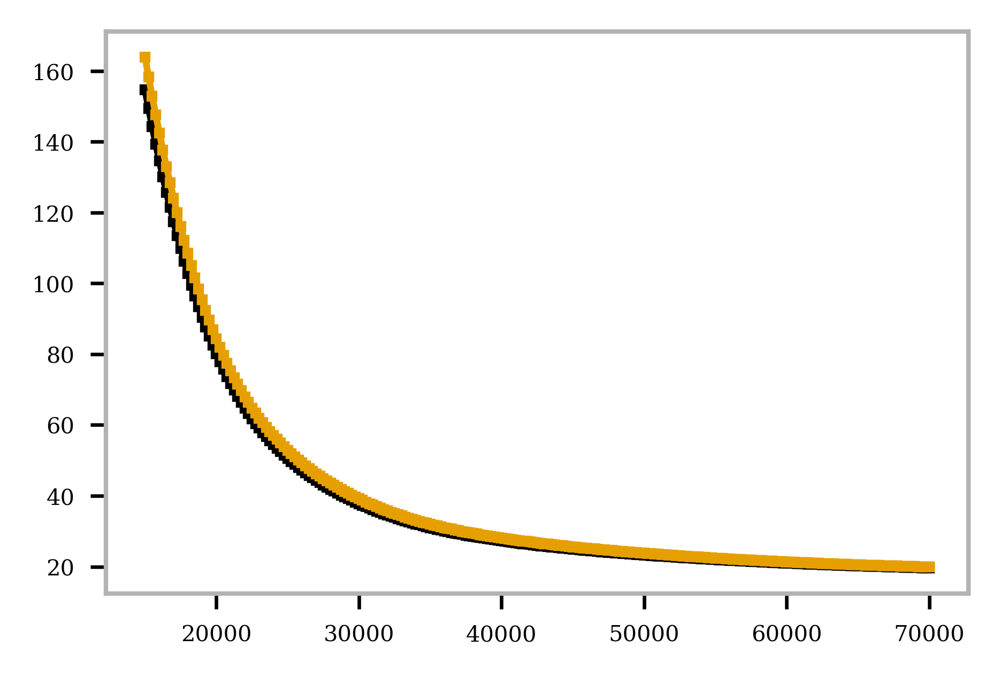

In [17]:
plt.plot(energies, mu_fibrogland(energies))
plt.plot(energies, mu_carcinoma(energies))

In [18]:
s = sp.Spek(kvp=50, dk = 0.1, th = 10, z = 15, mas = 150*20)
s.filter('Al', 3) # Create a spectrum
k, f = s.get_spectrum(edges=True, diff = True, flu = True) # Get the spectrum

tube_spectrum_txt = interpolate.interp1d(k*1e3, f, fill_value = 'extrapolate')
energies = np.arange(15, 50+0.25, 0.25)*1e3

In [19]:
test_spectrum = tube_spectrum_txt(energies)
test_spectrum = test_spectrum / np.sum(test_spectrum)

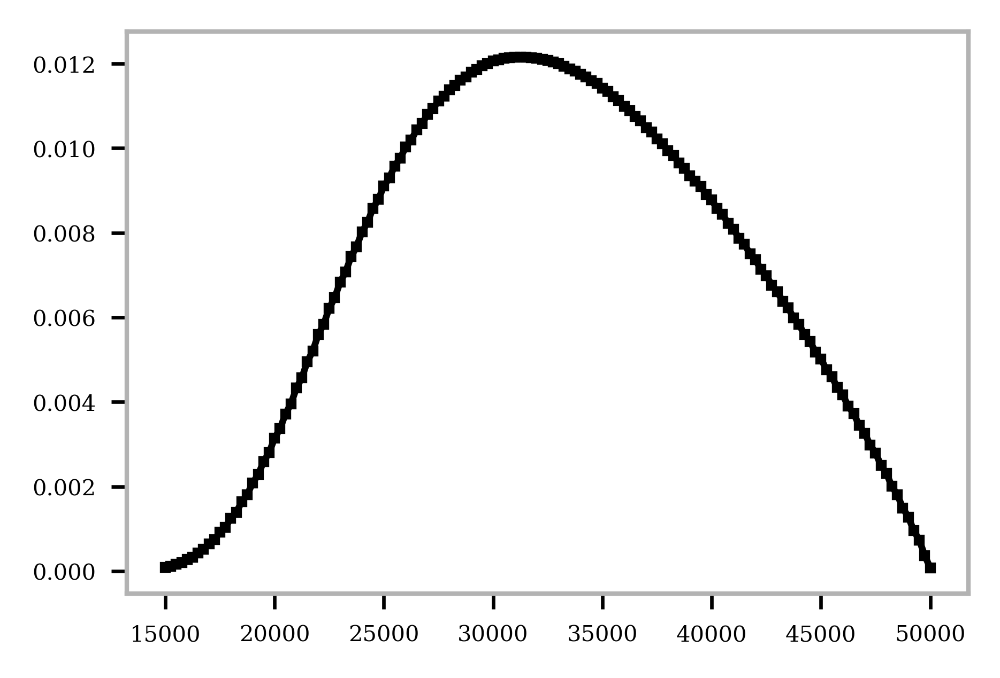

In [20]:
plt.plot(energies, test_spectrum)

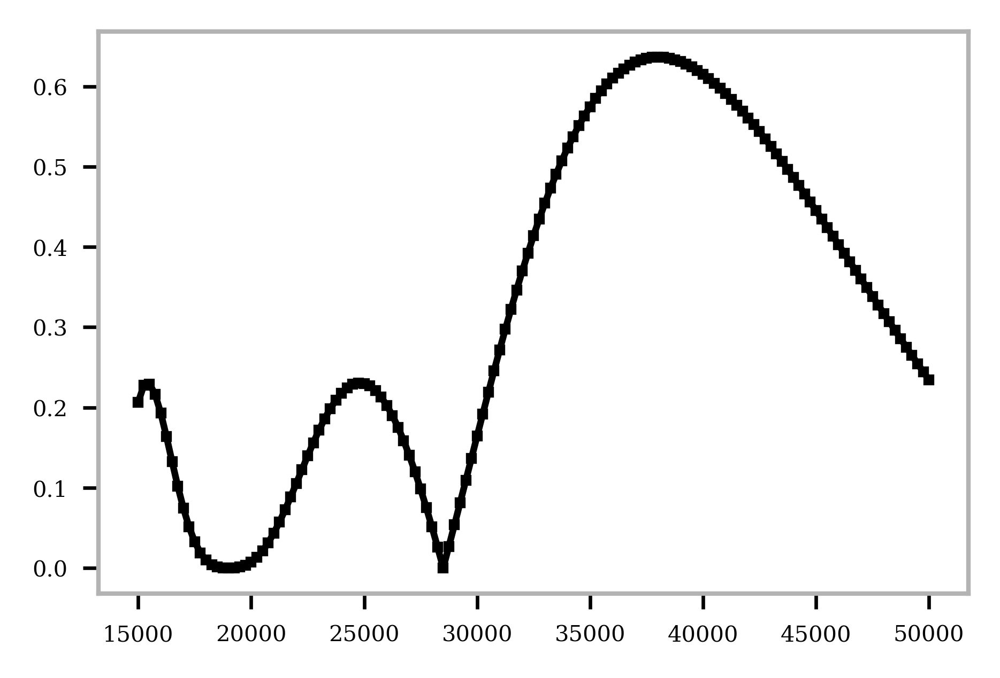

In [21]:
plt.plot(energies, calc_Vis_theoretical(energies, 38000, 3))

In [22]:
np.sum(test_spectrum * calc_Vis_theoretical(energies, 38000, 3))

0.3631599880167402

In [23]:
def effective_energy_CNRD_opening_angle(spectrum, energy, des_eng, TO, mu_gold, mu_silicon, deltas, mu, mu_breast_tissue, thickness, p, d, l, s, radius, dose = 0.2, z_g0=0.15, height = None, height_g1 = 59*1e-6, sample_pos = -1):

    att_grating = (np.exp(-mu_gold*height) + np.exp(-mu_silicon * height))/2 #* np.exp(-mu_silicon * 200e-6)#attenuation_grating(energy, height)

    att_silicon = (1 + np.exp(-mu_silicon * height_g1))/2 #* np.exp(-mu_silicon * 200*1e-6)
    
    vertical_thickness = 0.01
    
    if z_g0 < 0.15:

        vertical_thickness_area = vertical_thickness / (l+z_g0) *0.15 * 1e2
        op_angle = calculate_opening_angle(l+z_g0 + 0.1, thickness)
        z_g0 = 0.15
        sample_pos = 1
        vis_penalty = 0.65
        intensity_at_detector = np.sum(spectrum * att_grating**2 * att_silicon * np.exp(-mu_breast_tissue * thickness)) * (z_g0)**2 / (s+0.1)**2
    else:
        vertical_thickness_area = vertical_thickness / (l+z_g0) *z_g0 * 1e2
        op_angle = calculate_opening_angle(l+z_g0 + sample_pos*0.1, thickness)
        vis_penalty = 0.65
        intensity_at_detector = np.sum(spectrum * att_grating**2 * att_silicon * np.exp(-mu_breast_tissue * thickness)) * (z_g0)**2 / (s+z_g0)**2
       
    
    
    #print('opening angle: ', op_angle)
    # print('spectrum sum: ', np.sum(spectrum))
    area_flux = z_g0 * 1e2 * np.tan(op_angle) * vertical_thickness_area
    if sample_pos == 1:
        spectrum_dose = spectrum * area_flux * att_grating * att_silicon
        spectrum = spectrum * area_flux * att_grating**2 * att_silicon
    else:
        spectrum_dose = spectrum * area_flux * att_grating
        spectrum = spectrum * area_flux * att_grating**2 * att_silicon

    #total_photons = np.sum(spectrum) * op_angle
    total_photons = np.sum(spectrum) #* op_angle**2

    dose  = np.sum((spectrum_dose * energy/1e3 - spectrum_dose *energy/1e3* np.exp(-mu_breast_tissue * thickness)))

    ratio_after_sample = spectrum * np.exp(-mu_breast_tissue * thickness)
    spectrum_after_sample = ratio_after_sample /  np.sum(ratio_after_sample)
    if height is not None:
        V_total = np.sum(spectrum/np.sum(spectrum) * calc_Vis_theoretical(energy, des_eng, TO)*(1-np.exp(-mu_gold*height))**2) *vis_penalty
        V_total_after_sample = np.sum(spectrum_after_sample * calc_Vis_theoretical(energy, des_eng, TO)*(1-np.exp(-mu_gold*height))**2) *vis_penalty
        effective_spectrum_refraction = spectrum_after_sample * calc_Vis_theoretical(energy, des_eng, TO)*(1-np.exp(-mu_gold*height))**2
    else:
        V_total = np.sum(spectrum/np.sum(spectrum) * calc_Vis_theoretical(energy, des_eng, TO)) * vis_penalty
        V_total_after_sample = np.sum(spectrum_after_sample * calc_Vis_theoretical(energy, des_eng, TO)) * vis_penalty
        effective_spectrum_refraction = spectrum_after_sample * calc_Vis_theoretical(energy, des_eng, TO)

    effective_spectrum_refraction /= np.sum(effective_spectrum_refraction)

    effective_delta = np.sum(effective_spectrum_refraction * deltas(energy))

    effective_mu = np.sum(spectrum_after_sample * mu(energy))

    C_ref_total = 4 * np.pi * radius**2 * (d-thickness/2)  / p * effective_delta
    C_att_total = 4/3 * np.pi * radius**3 * effective_mu
    

    noise_ref = 1/  ( 1/(intensity_at_detector * V_total_after_sample**2))

    noise_abs = 1 / (1/intensity_at_detector)
    #noise_abs = intensity_at_detector/2

    CNRD_ref_total = C_ref_total * np.sqrt(noise_ref/dose)
    CNRD_att_total = C_att_total * np.sqrt(noise_abs/dose)

    CNRD = CNRD_ref_total + CNRD_att_total

    critical_radius = 3 * effective_delta / effective_mu * (d-thickness/2)  * V_total_after_sample / p

    return CNRD, CNRD_ref_total, CNRD_att_total, V_total, V_total_after_sample, critical_radius, total_photons, intensity_at_detector, dose




def attenuation_based_CNRD_opening_angle(spectrum, energy, mu, mu_breast_tissue, thickness, l, s, radius, dose, z_g0 = 0.15): 
    vertical_thickness = 0.01
    vertical_thickness_area = vertical_thickness / (l-0.1) *z_g0 * 1e2
    #print(vertical_thickness_area)
    
    
    
    op_angle = calculate_opening_angle(l, thickness)
    intensity_at_detector = np.sum(spectrum * np.exp(-mu_breast_tissue * thickness)) * z_g0**2 / s**2
    #area_flux = (z_g0 * 1e2 * np.tan(op_angle)) **2
    area_flux = z_g0 * 1e2 * np.tan(op_angle) * vertical_thickness_area
    spectrum = spectrum * area_flux



    total_photons = np.sum(spectrum) #* op_angle**2

    dose  = np.sum((spectrum * energy/1e3 - spectrum *energy/1e3* np.exp(-mu_breast_tissue * thickness))) #* op_angle**2

    ratio_after_sample = spectrum * np.exp(-mu_breast_tissue * thickness)
    spectrum_after_sample = ratio_after_sample /  np.sum(ratio_after_sample)

    C_att_total = 4/3 * np.pi * radius**3 * np.sum(spectrum_after_sample * mu(energy))

    noise_abs = 1 / (1/intensity_at_detector)
    CNRD_att_total = C_att_total * np.sqrt(noise_abs/dose)
    
    return CNRD_att_total, total_photons, intensity_at_detector, dose

In [24]:
for i in tqdm.tqdm(spectrum_kvp):

    spec_txt = tube_dict[i]
    mu_breast_tissue = mu_dict[i]
    mu_au_ = mu_au_dict[i]
    mu_si_ = mu_si_dict[i]
    delta_breast_tissue = delta_dict[i]
    energies = np.arange(15, i+0.25, 0.25)*1e3

100%|██████████| 46/46 [00:00<00:00, 22263.79it/s]


In [25]:
spectrum_kvp

array([25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,
       42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58,
       59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70])

# Starting with a 2m system

In [26]:
L_iterate = np.arange(0.1, 1.0, 0.05)#np.arange(0.1, 1.02, 0.02)

AR = 50
design_eng = np.linspace(20000, 46000, 27)
p0_iterate = np.arange(3, 10, 0.1)*1e-6
TO = np.array([1,3,5,7])
p0s = []
p1s = []
p2s = []
TOs = []
D = []
S = []
L = []
z_g0s = []
sensitivity = []
eng_used = []
heights = []
heights_g1 = []
sample_positions = []
gold_heights_per_eng = 3/mu_au(design_eng)


for to in TO:
    for idx, eng in enumerate(design_eng):
        for p in p0_iterate:
            for l in L_iterate:
                try:

                    height = p*AR/2
                
                    if height < gold_heights_per_eng[idx] or height < 120e-6:
                        continue
                    p1, p2, d, s = calculate_td(eng, p, l, to)
                    
                    if (s + 0.15) > 2:
                        continue
                    
                    heights_g1.append(calculate_G1_height(eng))
                    heights.append(height)
                    p0s.append(p)
                    p1s.append(p1)
                    p2s.append(p2)
                    D.append(d)
                    S.append(s)
                    L.append(l)
                    sensitivity.append(p2 / (2*np.pi*d))
                    eng_used.append(eng)
                    TOs.append(to)
                    z_g0s.append(0.15)
                    sample_positions.append(1)
                    
                except Exception as e:
                    #print(e)
                    continue

p1, p2, d, s = calculate_td(46000, 4.2*1e-6, 0.8180881351464869, 5)
p0s.append(4.2*1e-6)
p1s.append(p1)
p2s.append(p2)
D.append(d)
S.append(s)
L.append(0.8180881351464869)
eng_used.append(46000)
sensitivity.append(p2 / (2*np.pi*d))
TOs.append(5)
heights.append(180e-6)
heights_g1.append(calculate_G1_height(46000))
z_g0s.append(0.1)
sample_positions.append(1)


parameters_dict = {'p0': np.asarray(p0s),
                  'p1': np.asarray(p1s),
                  'p2': np.asarray(p2s),
                  'D': np.asarray(D),
                  'S': np.asarray(S),
                  'L': np.asarray(L),
                  'eng': np.asarray(eng_used),
                  'TO': np.asarray(TOs),
                  'height': np.asarray(heights),
                  'height_g1': np.asarray(heights_g1),
                  'z_g0': np.asarray(z_g0s),
                  'sample_pos': np.asarray(sample_positions)}


In [27]:
dict_sub, _, interception_radii = calculate_constraints_FOV(parameters_dict, 0.15)
#dict_sub, _ = calculate_constraints_FOV(parameters_dict, 0.15)


## Breast size 14cm

In [28]:
max_2mm = []
max_1_5mm = []
max_1mm = []
max_05mm = []

max_2mm_ref = []
max_1mm_ref = []
max_1_5mm_ref = []
max_05mm_ref = []

max_2mm_att = []
max_1mm_att = []
max_1_5mm_att = []
max_05mm_att = []

breast_size = 0.14

for i in tqdm.tqdm(spectrum_kvp):

    spec_txt = tube_dict[i]
    mu_breast_tissue = mu_dict[i]
    mu_au_ = mu_au_dict[i]
    mu_si_ = mu_si_dict[i]
    delta_breast_tissue = delta_dict[i]
    energies = np.arange(15, i+0.25, 0.25)*1e3
    
    mu_d_adi_gland = lambda E: _t("mu", fibrogland, carcinoma, E*cnst.e)
    delta_d_adi_gland = lambda E: _t("delta", fibrogland, carcinoma, E*cnst.e)
    
    V_totals = []
    V_sample = []
    critical_radius = []
    total_photons = []
    int_detector = []
    doses = []


    CNRD_commercial, tot_photons, int_d, dose = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00075, 0.2)
    dict_sub[f'CNRD_commercial_{i}_2000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.0005, 0.2)
    dict_sub[f'CNRD_commercial_{i}_1000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00025, 0.2)
    dict_sub[f'CNRD_commercial_{i}_500um'] = CNRD_commercial

    doses.append(dose)
    total_photons.append(tot_photons)
    int_detector.append(int_d)

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, V_total, V_s, crit_radius, tot_photons, int_d, dose  = effective_energy_CNRD_opening_angle(spec_txt, energies, 
                                                                                                                             d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                                                             mu_d_adi_gland, mu_breast_tissue, breast_size, 
                                                                                                                             p, d, l, s, 0.0005, 0.2, z_g0,height = height, 
                                                                                                                             height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)
        critical_radius.append(crit_radius)
        total_photons.append(tot_photons)
        int_detector.append(int_d)
        doses.append(dose)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_1000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_1000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_1000um"] = CNRDs_att




    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, 
                                                                                          delta_d_adi_gland, mu_d_adi_gland, mu_breast_tissue, 
                                                                                          breast_size, p, d, l, s, 0.00075, 0.2, z_g0,height = height, 
                                                                                          height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_2000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_2000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_2000um"] = CNRDs_att

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []
    
    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                          mu_d_adi_gland, mu_breast_tissue, breast_size, p, d, l, s, 0.00025, 0.2, 
                                                                                          z_g0,height = height, height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_500um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_500um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_500um"] = CNRDs_att
    
    dict_sub[f"V_total_{i}"] = np.asarray(V_totals)
    dict_sub[f"V_Sample_{i}"] = np.asarray(V_sample)
    dict_sub[f"critical_radius_{i}"] = np.asarray(critical_radius)
    dict_sub[f"Total_photons_{i}"] = np.asarray(total_photons)
    dict_sub[f"Photons_detector_{i}"] = np.asarray(int_detector)
    dict_sub[f"Dose_{i}"] = np.asarray(doses)

    max_1mm.append(np.max(dict_sub[f"CNRD_{i}_1000um"][:-2]))
    # max_1_5mm.append(np.max(dict_sub[f"CNRD_{i}_1500um"][:-2]))
    max_2mm.append(np.max(dict_sub[f"CNRD_{i}_2000um"][:-2]))
    max_05mm.append(np.max(dict_sub[f"CNRD_{i}_500um"][:-2]))
    
    max_1mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1000um"][:-2]))
    max_05mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_500um"][:-2]))
    # max_1_5mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1500um"][:-2]))
    max_2mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_2000um"][:-2]))

    
    
    max_1mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1000um"][:-2]))
    max_05mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_500um"][:-2]))
    max_2mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_2000um"][:-2]))
    # max_1_5mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1500um"][:-2]))

    
    # # max_05mm_att.append(np.max(dict_sub['CNRD_att_500um']))
    

100%|██████████| 46/46 [01:45<00:00,  2.29s/it]


Text(0.5, 1.0, 'Critical radius per kVp')

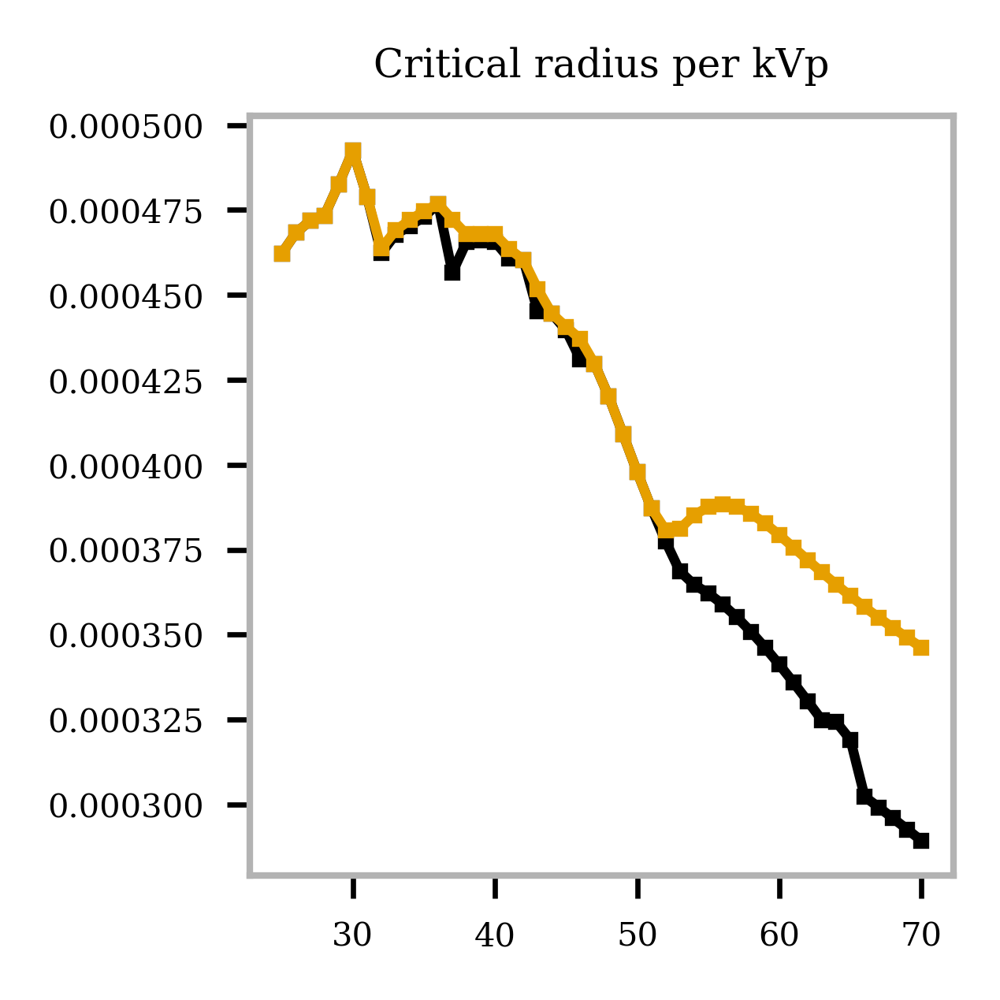

In [29]:
plt.figure(figsize=(2,2))
max_radius_best_system = [dict_sub[f'critical_radius_{i}'][np.argmax(dict_sub[f'CNRD_{i}_500um'][:-1])] for i in spectrum_kvp]
max_radius = [np.max(dict_sub[f'critical_radius_{i}']) for i in spectrum_kvp]
plt.plot(spectrum_kvp, np.asarray(max_radius_best_system))
plt.plot(spectrum_kvp, np.asarray(max_radius))

plt.title('Critical radius per kVp')

In [30]:
for kvp in spectrum_kvp:
    idx_max = np.argmax(dict_sub[f'CNRD_{kvp}_500um'][:-1])
    print('----------------------------')
    print('kvp: ', kvp)
    print('idx_max: ', idx_max)
    for key in dict_sub.keys():
        if 'CNR' in key and key != f'CNRD_{kvp}_500um':
            continue
        if 'V_total' in key and key != f'V_total_{kvp}':
            continue
        if 'V_Sample'in key and key != f'V_Sample_{kvp}':
            continue
        if 'Total_photons' in key and key != f'Total_photons_{kvp}':
            continue
        if 'critical_radius' in key and key != f'critical_radius_{kvp}':
            continue
        if 'Photons_detector' in key and key != f'Photons_detector_{kvp}':
            continue
        if 'Dose' in key and key != f'Dose_{kvp}':
            continue
        print(f"{key}: ", dict_sub[key][idx_max])

----------------------------
kvp:  25
idx_max:  4623
p0:  5.200000000000002e-06
p1:  5.3313796816738865e-06
p2:  5.46957014011648e-06
D:  0.9466563704047753
S:  1.8466563704047756
L:  0.9000000000000002
eng:  23000.0
TO:  7
height:  0.00013000000000000004
height_g1:  2.9350722612621482e-05
z_g0:  0.15
sample_pos:  1
CNRD_25_500um:  2.0665851611383741e-13
V_total_25:  0.276154269424378
V_Sample_25:  0.35204229752798566
critical_radius_25:  0.0004621934256278916
Total_photons_25:  29772976883.710506
Photons_detector_25:  221335.75400503696
Dose_25:  1415208081967.767
----------------------------
kvp:  26
idx_max:  4627
p0:  5.100000000000001e-06
p1:  5.209420015753242e-06
p2:  5.323638167148125e-06
D:  0.9394655589084927
S:  1.839465558908493
L:  0.9000000000000002
eng:  24000.0
TO:  7
height:  0.00012750000000000004
height_g1:  3.063562040963009e-05
z_g0:  0.15
sample_pos:  1
CNRD_26_500um:  2.3528978695666394e-13
V_total_26:  0.26718279704282805
V_Sample_26:  0.345889869593699
critical

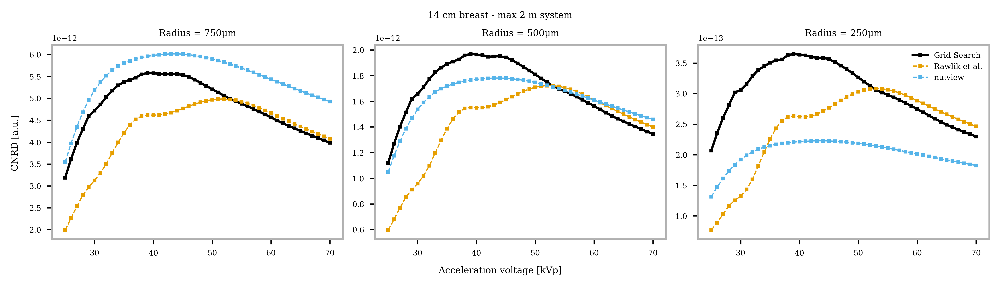

In [32]:
list_max_14 = [max_2mm, max_1mm, max_05mm]

list_max_14_ref = [max_2mm_ref, max_1mm_ref, max_05mm_ref]
list_max_14_att = [max_2mm_att, max_1mm_att, max_05mm_att]

corrected_rad = [750, 500, 250]

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

for i, rad in enumerate([2000, 1000, 500]):
    CNR_per_energy_static = [dict_sub[f'CNRD_{j}_{rad}um'][-1] for j in spectrum_kvp]
    axs[i].plot(spectrum_kvp, list_max_14[i], label = 'Grid-Search',)
    axs[i].plot(spectrum_kvp, CNR_per_energy_static, label = 'Rawlik et al.', linestyle = 'dashed', linewidth = 0.8)
    axs[i].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_{rad}um'] for j in spectrum_kvp], label = 'nu:view', linestyle = 'dashed', linewidth = 0.8)
    #axs[i].legend()
    axs[i].set_title('Radius = ' + str(corrected_rad[i]) + 'µm')
    #axs[i].axvline(50)

    #axs[i].axvline(46)
axs[i].legend()
fig.supxlabel('Acceleration voltage [kVp]')
fig.supylabel('CNRD [a.u.]')
fig.suptitle('14 cm breast - max 2 m system')
plt.show()

CNRD_static_2000_14 = [dict_sub[f'CNRD_{j}_2000um'][-1] for j in spectrum_kvp]
CNRD_static_1000_14 = [dict_sub[f'CNRD_{j}_1000um'][-1] for j in spectrum_kvp]
CNRD_static_500_14 = [dict_sub[f'CNRD_{j}_500um'][-1] for j in spectrum_kvp]

CNRD_static_14 = [CNRD_static_2000_14, CNRD_static_1000_14, CNRD_static_500_14]

CNRD_abct_2000_14 = [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp]
CNRD_abct_1000_14 = [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp]
CNRD_abct_500_14 = [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp]

CNRD_abct_14 = [CNRD_abct_2000_14, CNRD_abct_1000_14, CNRD_abct_500_14]



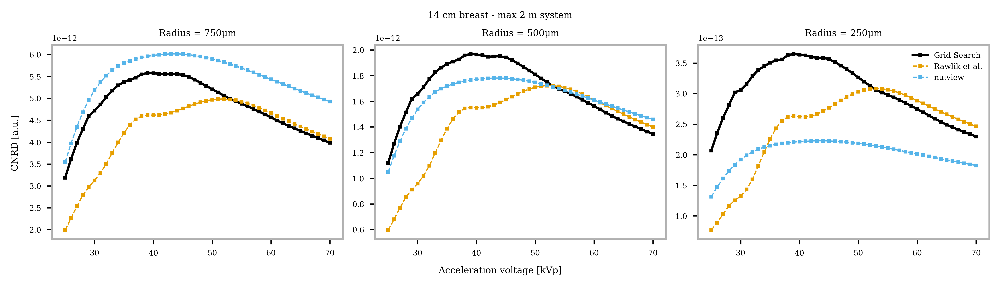

In [33]:
list_max_14 = [max_2mm, max_1mm, max_05mm]

list_max_14_ref = [max_2mm_ref, max_1mm_ref, max_05mm_ref]
list_max_14_att = [max_2mm_att, max_1mm_att, max_05mm_att]

corrected_rad = [750, 500, 250]

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

for i, rad in enumerate([2000, 1000, 500]):
    CNR_per_energy_static = [dict_sub[f'CNRD_{j}_{rad}um'][-1] for j in spectrum_kvp]
    axs[i].plot(spectrum_kvp, list_max_14[i], label = 'Grid-Search',)
    axs[i].plot(spectrum_kvp, CNR_per_energy_static, label = 'Rawlik et al.', linestyle = 'dashed', linewidth = 0.8)
    axs[i].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_{rad}um'] for j in spectrum_kvp], label = 'nu:view', linestyle = 'dashed', linewidth = 0.8)
    #axs[i].legend()
    axs[i].set_title('Radius = ' + str(corrected_rad[i]) + 'µm')
    #axs[i].axvline(50)

    #axs[i].axvline(46)
axs[i].legend()
fig.supxlabel('Acceleration voltage [kVp]')
fig.supylabel('CNRD [a.u.]')
fig.suptitle('14 cm breast - max 2 m system')
#plt.savefig('data/2m_CNRD_carcinoma_fibrogland_14cm_breast_pxScaled.png', bbox_inches = 'tight')
plt.show()

CNRD_static_2000_14 = [dict_sub[f'CNRD_{j}_2000um'][-1] for j in spectrum_kvp]
CNRD_static_1000_14 = [dict_sub[f'CNRD_{j}_1000um'][-1] for j in spectrum_kvp]
CNRD_static_500_14 = [dict_sub[f'CNRD_{j}_500um'][-1] for j in spectrum_kvp]

CNRD_static_14 = [CNRD_static_2000_14, CNRD_static_1000_14, CNRD_static_500_14]

CNRD_abct_2000_14 = [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp]
CNRD_abct_1000_14 = [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp]
CNRD_abct_500_14 = [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp]

CNRD_abct_14 = [CNRD_abct_2000_14, CNRD_abct_1000_14, CNRD_abct_500_14]



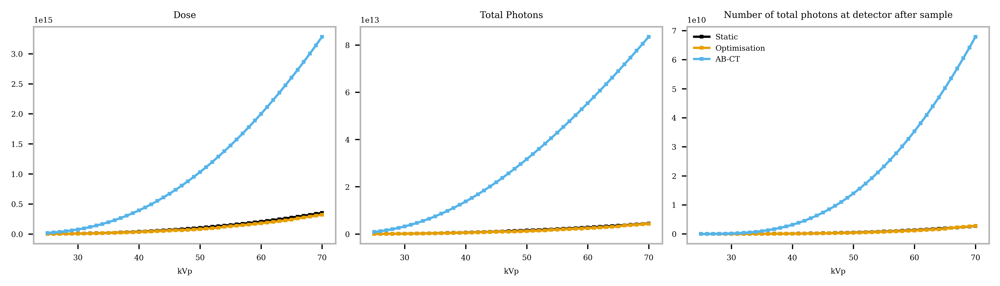

In [34]:

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

total_photons_static = [dict_sub[f'Dose_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Dose_{j}'][0] for j in spectrum_kvp]
idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Dose_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]


axs[0].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[0].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[0].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[0].set_title('Dose')
axs[0].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Total_photons_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Total_photons_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Total_photons_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]
axs[1].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[1].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[1].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[1].set_title('Total Photons')
axs[1].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Photons_detector_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Photons_detector_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Photons_detector_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]

axs[2].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[2].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[2].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[2].set_title('Number of total photons at detector after sample')
axs[2].set_xlabel('kVp')



axs[2].legend()

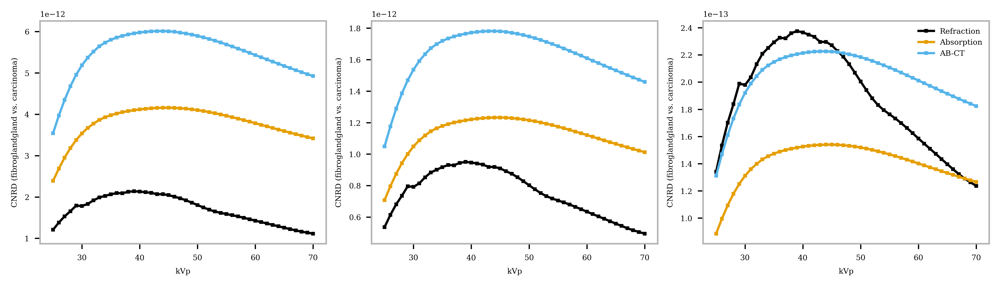

In [35]:
fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

axs[0].plot(spectrum_kvp, max_2mm_ref, label = 'Refraction')
axs[0].plot(spectrum_kvp, np.asarray(max_2mm_att), label = 'Absorption')
axs[0].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[0].set_xlabel('kVp')
axs[0].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[1].plot(spectrum_kvp, max_1mm_ref, label = 'Refraction')
axs[1].plot(spectrum_kvp, np.asarray(max_1mm_att), label = 'Absorption')
axs[1].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[1].set_xlabel('kVp')
axs[1].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].plot(spectrum_kvp, max_05mm_ref, label = 'Refraction')
axs[2].plot(spectrum_kvp, np.asarray(max_05mm_att), label = 'Absorption')
axs[2].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp], label = 'AB-CT')

axs[2].set_xlabel('kVp')
axs[2].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].legend()



## 9cm breast

In [36]:
max_2mm = []
max_1_5mm = []
max_1mm = []
max_05mm = []

max_2mm_ref = []
max_1mm_ref = []
max_1_5mm_ref = []
max_05mm_ref = []

max_2mm_att = []
max_1mm_att = []
max_1_5mm_att = []
max_05mm_att = []

breast_size = 0.09

for i in tqdm.tqdm(spectrum_kvp):

    spec_txt = tube_dict[i]
    mu_breast_tissue = mu_dict[i]
    mu_au_ = mu_au_dict[i]
    mu_si_ = mu_si_dict[i]
    delta_breast_tissue = delta_dict[i]
    energies = np.arange(15, i+0.25, 0.25)*1e3
    
    mu_d_adi_gland = lambda E: _t("mu", fibrogland, carcinoma, E*cnst.e)
    delta_d_adi_gland = lambda E: _t("delta", fibrogland, carcinoma, E*cnst.e)
    
    V_totals = []
    V_sample = []
    critical_radius = []
    total_photons = []
    int_detector = []
    doses = []


    CNRD_commercial, tot_photons, int_d, dose = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00075, 0.2)
    dict_sub[f'CNRD_commercial_{i}_2000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.0005, 0.2)
    dict_sub[f'CNRD_commercial_{i}_1000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00025, 0.2)
    dict_sub[f'CNRD_commercial_{i}_500um'] = CNRD_commercial

    doses.append(dose)
    total_photons.append(tot_photons)
    int_detector.append(int_d)

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, V_total, V_s, crit_radius, tot_photons, int_d, dose  = effective_energy_CNRD_opening_angle(spec_txt, energies, 
                                                                                                                             d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                                                             mu_d_adi_gland, mu_breast_tissue, breast_size, 
                                                                                                                             p, d, l, s, 0.0005, 0.2, z_g0,height = height, 
                                                                                                                             height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)
        critical_radius.append(crit_radius)
        total_photons.append(tot_photons)
        int_detector.append(int_d)
        doses.append(dose)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_1000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_1000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_1000um"] = CNRDs_att




    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, 
                                                                                          delta_d_adi_gland, mu_d_adi_gland, mu_breast_tissue, 
                                                                                          breast_size, p, d, l, s, 0.00075, 0.2, z_g0,height = height, 
                                                                                          height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_2000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_2000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_2000um"] = CNRDs_att

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []
    
    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                          mu_d_adi_gland, mu_breast_tissue, breast_size, p, d, l, s, 0.00025, 0.2, 
                                                                                          z_g0,height = height, height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_500um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_500um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_500um"] = CNRDs_att
    
    dict_sub[f"V_total_{i}"] = np.asarray(V_totals)
    dict_sub[f"V_Sample_{i}"] = np.asarray(V_sample)
    dict_sub[f"critical_radius_{i}"] = np.asarray(critical_radius)
    dict_sub[f"Total_photons_{i}"] = np.asarray(total_photons)
    dict_sub[f"Photons_detector_{i}"] = np.asarray(int_detector)
    dict_sub[f"Dose_{i}"] = np.asarray(doses)

    max_1mm.append(np.max(dict_sub[f"CNRD_{i}_1000um"][:-2]))
    # max_1_5mm.append(np.max(dict_sub[f"CNRD_{i}_1500um"][:-2]))
    max_2mm.append(np.max(dict_sub[f"CNRD_{i}_2000um"][:-2]))
    max_05mm.append(np.max(dict_sub[f"CNRD_{i}_500um"][:-2]))
    
    max_1mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1000um"][:-2]))
    max_05mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_500um"][:-2]))
    # max_1_5mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1500um"][:-2]))
    max_2mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_2000um"][:-2]))

    
    
    max_1mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1000um"][:-2]))
    max_05mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_500um"][:-2]))
    max_2mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_2000um"][:-2]))
    # max_1_5mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1500um"][:-2]))

    
    # # max_05mm_att.append(np.max(dict_sub['CNRD_att_500um']))
    

100%|██████████| 46/46 [01:46<00:00,  2.32s/it]


Text(0.5, 1.0, 'Critical radius per kVp')

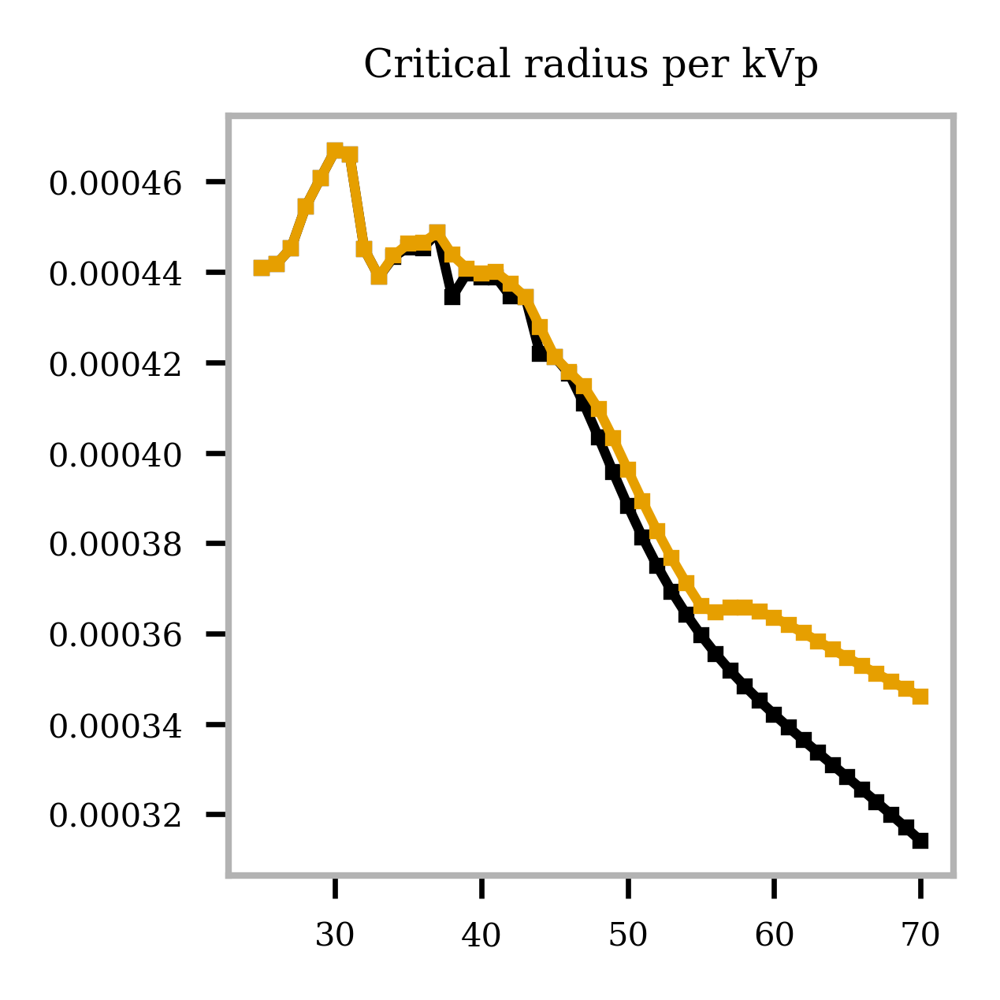

In [37]:
plt.figure(figsize=(2,2))
max_radius_best_system = [dict_sub[f'critical_radius_{i}'][np.argmax(dict_sub[f'CNRD_{i}_500um'][:-1])] for i in spectrum_kvp]
max_radius = [np.max(dict_sub[f'critical_radius_{i}']) for i in spectrum_kvp]
plt.plot(spectrum_kvp, np.asarray(max_radius_best_system))
plt.plot(spectrum_kvp, np.asarray(max_radius))

plt.title('Critical radius per kVp')

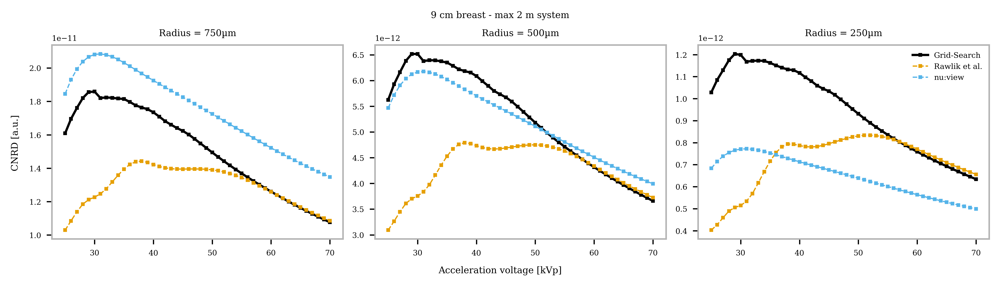

In [38]:
list_max_9 = [max_2mm, max_1mm, max_05mm]

list_max_9_ref = [max_2mm_ref, max_1mm_ref, max_05mm_ref]
list_max_9_att = [max_2mm_att, max_1mm_att, max_05mm_att]

corrected_rad = [750, 500, 250]

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

for i, rad in enumerate([2000, 1000, 500]):
    CNR_per_energy_static = [dict_sub[f'CNRD_{j}_{rad}um'][-1] for j in spectrum_kvp]
    axs[i].plot(spectrum_kvp, list_max_9[i], label = 'Grid-Search',)
    axs[i].plot(spectrum_kvp, CNR_per_energy_static, label = 'Rawlik et al.', linestyle = 'dashed', linewidth = 0.8)
    axs[i].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_{rad}um'] for j in spectrum_kvp], label = 'nu:view', linestyle = 'dashed', linewidth = 0.8)
    #axs[i].legend()
    axs[i].set_title('Radius = ' + str(corrected_rad[i]) + 'µm')
    #axs[i].axvline(50)

    #axs[i].axvline(46)
axs[i].legend()
fig.supxlabel('Acceleration voltage [kVp]')
fig.supylabel('CNRD [a.u.]')
fig.suptitle('9 cm breast - max 2 m system')
plt.show()

CNRD_static_2000_9 = [dict_sub[f'CNRD_{j}_2000um'][-1] for j in spectrum_kvp]
CNRD_static_1000_9 = [dict_sub[f'CNRD_{j}_1000um'][-1] for j in spectrum_kvp]
CNRD_static_500_9 = [dict_sub[f'CNRD_{j}_500um'][-1] for j in spectrum_kvp]

CNRD_static_9 = [CNRD_static_2000_9, CNRD_static_1000_9, CNRD_static_500_9]

CNRD_abct_2000_9 = [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp]
CNRD_abct_1000_9 = [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp]
CNRD_abct_500_9 = [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp]

CNRD_abct_9 = [CNRD_abct_2000_9, CNRD_abct_1000_9, CNRD_abct_500_9]

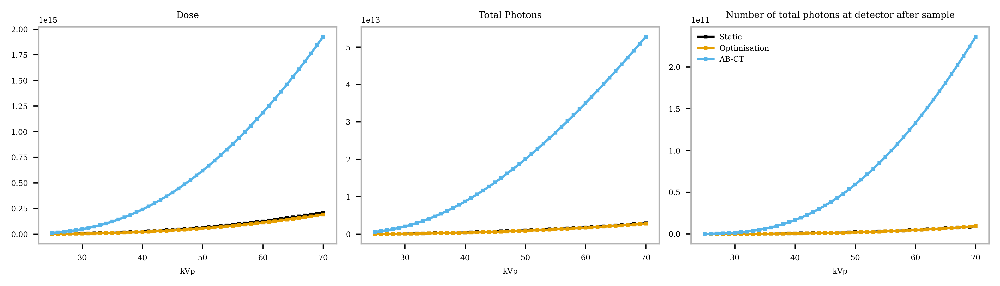

In [39]:

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

total_photons_static = [dict_sub[f'Dose_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Dose_{j}'][0] for j in spectrum_kvp]
idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Dose_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]


axs[0].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[0].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[0].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[0].set_title('Dose')
axs[0].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Total_photons_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Total_photons_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Total_photons_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]
axs[1].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[1].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[1].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[1].set_title('Total Photons')
axs[1].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Photons_detector_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Photons_detector_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Photons_detector_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]

axs[2].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[2].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[2].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[2].set_title('Number of total photons at detector after sample')
axs[2].set_xlabel('kVp')



axs[2].legend()

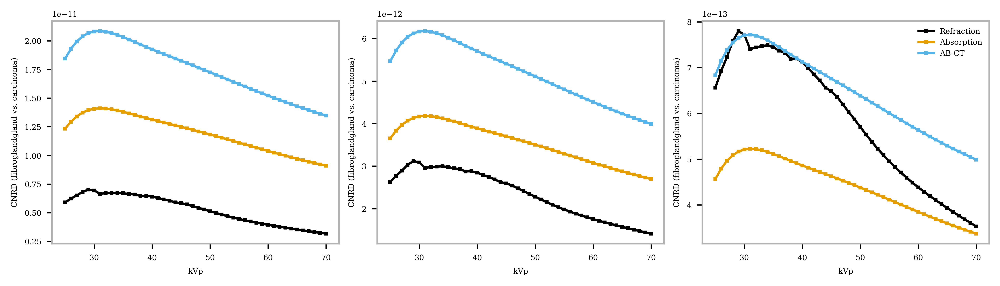

In [40]:
fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

axs[0].plot(spectrum_kvp, max_2mm_ref, label = 'Refraction')
axs[0].plot(spectrum_kvp, np.asarray(max_2mm_att), label = 'Absorption')
axs[0].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[0].set_xlabel('kVp')
axs[0].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[1].plot(spectrum_kvp, max_1mm_ref, label = 'Refraction')
axs[1].plot(spectrum_kvp, np.asarray(max_1mm_att), label = 'Absorption')
axs[1].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[1].set_xlabel('kVp')
axs[1].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].plot(spectrum_kvp, max_05mm_ref, label = 'Refraction')
axs[2].plot(spectrum_kvp, np.asarray(max_05mm_att), label = 'Absorption')
axs[2].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp], label = 'AB-CT')

axs[2].set_xlabel('kVp')
axs[2].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].legend()

## 18cm breast

In [41]:
max_2mm = []
max_1_5mm = []
max_1mm = []
max_05mm = []

max_2mm_ref = []
max_1mm_ref = []
max_1_5mm_ref = []
max_05mm_ref = []

max_2mm_att = []
max_1mm_att = []
max_1_5mm_att = []
max_05mm_att = []

breast_size = 0.18

for i in tqdm.tqdm(spectrum_kvp):

    spec_txt = tube_dict[i]
    mu_breast_tissue = mu_dict[i]
    mu_au_ = mu_au_dict[i]
    mu_si_ = mu_si_dict[i]
    delta_breast_tissue = delta_dict[i]
    energies = np.arange(15, i+0.25, 0.25)*1e3
    
    mu_d_adi_gland = lambda E: _t("mu", fibrogland, carcinoma, E*cnst.e)
    delta_d_adi_gland = lambda E: _t("delta", fibrogland, carcinoma, E*cnst.e)
    
    V_totals = []
    V_sample = []
    critical_radius = []
    total_photons = []
    int_detector = []
    doses = []


    CNRD_commercial, tot_photons, int_d, dose = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00075, 0.2)
    dict_sub[f'CNRD_commercial_{i}_2000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.0005, 0.2)
    dict_sub[f'CNRD_commercial_{i}_1000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00025, 0.2)
    dict_sub[f'CNRD_commercial_{i}_500um'] = CNRD_commercial

    doses.append(dose)
    total_photons.append(tot_photons)
    int_detector.append(int_d)

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, V_total, V_s, crit_radius, tot_photons, int_d, dose  = effective_energy_CNRD_opening_angle(spec_txt, energies, 
                                                                                                                             d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                                                             mu_d_adi_gland, mu_breast_tissue, breast_size, 
                                                                                                                             p, d, l, s, 0.0005, 0.2, z_g0,height = height, 
                                                                                                                             height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)
        critical_radius.append(crit_radius)
        total_photons.append(tot_photons)
        int_detector.append(int_d)
        doses.append(dose)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_1000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_1000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_1000um"] = CNRDs_att




    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, 
                                                                                          delta_d_adi_gland, mu_d_adi_gland, mu_breast_tissue, 
                                                                                          breast_size, p, d, l, s, 0.00075, 0.2, z_g0,height = height, 
                                                                                          height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_2000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_2000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_2000um"] = CNRDs_att

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []
    
    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                          mu_d_adi_gland, mu_breast_tissue, breast_size, p, d, l, s, 0.00025, 0.2, 
                                                                                          z_g0,height = height, height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_500um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_500um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_500um"] = CNRDs_att
    
    dict_sub[f"V_total_{i}"] = np.asarray(V_totals)
    dict_sub[f"V_Sample_{i}"] = np.asarray(V_sample)
    dict_sub[f"critical_radius_{i}"] = np.asarray(critical_radius)
    dict_sub[f"Total_photons_{i}"] = np.asarray(total_photons)
    dict_sub[f"Photons_detector_{i}"] = np.asarray(int_detector)
    dict_sub[f"Dose_{i}"] = np.asarray(doses)

    max_1mm.append(np.max(dict_sub[f"CNRD_{i}_1000um"][:-2]))
    # max_1_5mm.append(np.max(dict_sub[f"CNRD_{i}_1500um"][:-2]))
    max_2mm.append(np.max(dict_sub[f"CNRD_{i}_2000um"][:-2]))
    max_05mm.append(np.max(dict_sub[f"CNRD_{i}_500um"][:-2]))
    
    max_1mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1000um"][:-2]))
    max_05mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_500um"][:-2]))
    # max_1_5mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1500um"][:-2]))
    max_2mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_2000um"][:-2]))

    
    
    max_1mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1000um"][:-2]))
    max_05mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_500um"][:-2]))
    max_2mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_2000um"][:-2]))
    # max_1_5mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1500um"][:-2]))

    
    # # max_05mm_att.append(np.max(dict_sub['CNRD_att_500um']))
    

  0%|          | 0/46 [00:00<?, ?it/s]

100%|██████████| 46/46 [01:45<00:00,  2.30s/it]


Text(0.5, 1.0, 'Critical radius per kVp')

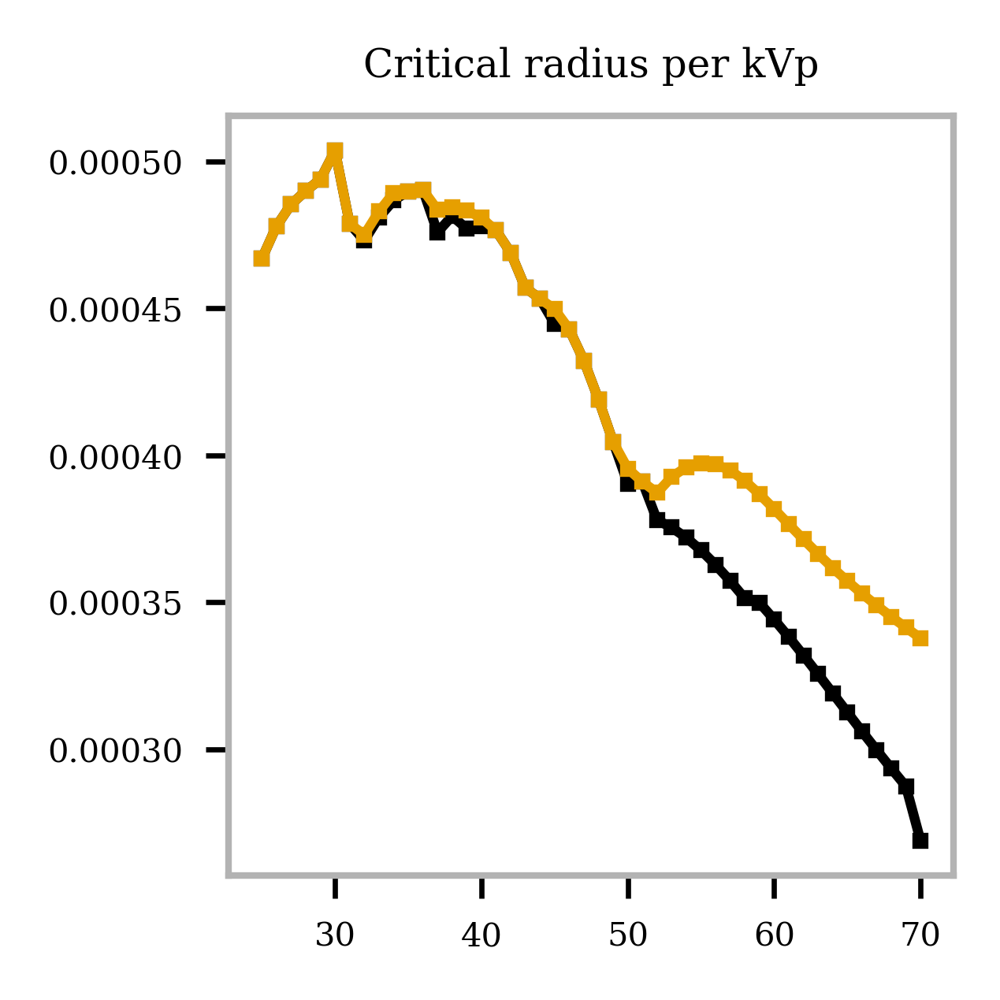

In [42]:
plt.figure(figsize=(2,2))
max_radius_best_system = [dict_sub[f'critical_radius_{i}'][np.argmax(dict_sub[f'CNRD_{i}_500um'][:-1])] for i in spectrum_kvp]
max_radius = [np.max(dict_sub[f'critical_radius_{i}']) for i in spectrum_kvp]
plt.plot(spectrum_kvp, np.asarray(max_radius_best_system))
plt.plot(spectrum_kvp, np.asarray(max_radius))

plt.title('Critical radius per kVp')

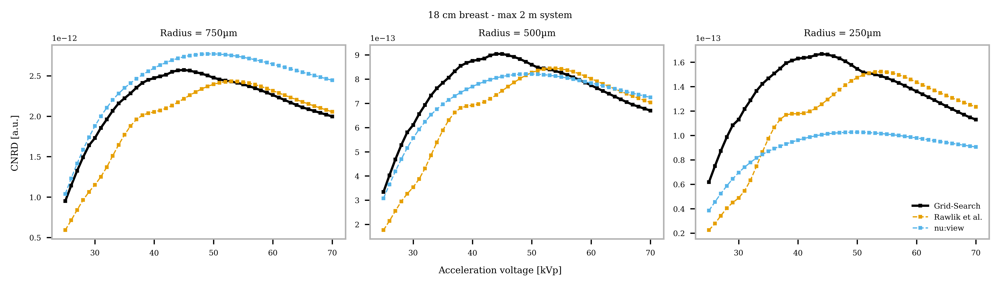

In [43]:
list_max_18 = [max_2mm, max_1mm, max_05mm]

list_max_18_ref = [max_2mm_ref, max_1mm_ref, max_05mm_ref]
list_max_18_att = [max_2mm_att, max_1mm_att, max_05mm_att]

corrected_rad = [750, 500, 250]

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

for i, rad in enumerate([2000, 1000, 500]):
    CNR_per_energy_static = [dict_sub[f'CNRD_{j}_{rad}um'][-1] for j in spectrum_kvp]
    axs[i].plot(spectrum_kvp, list_max_18[i], label = 'Grid-Search',)
    axs[i].plot(spectrum_kvp, CNR_per_energy_static, label = 'Rawlik et al.', linestyle = 'dashed', linewidth = 0.8)
    axs[i].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_{rad}um'] for j in spectrum_kvp], label = 'nu:view', linestyle = 'dashed', linewidth = 0.8)
    #axs[i].legend()
    axs[i].set_title('Radius = ' + str(corrected_rad[i]) + 'µm')
    #axs[i].axvline(50)

    #axs[i].axvline(46)
axs[i].legend()
fig.supxlabel('Acceleration voltage [kVp]')
fig.supylabel('CNRD [a.u.]')
fig.suptitle('18 cm breast - max 2 m system')
plt.show()

CNRD_static_2000_18 = [dict_sub[f'CNRD_{j}_2000um'][-1] for j in spectrum_kvp]
CNRD_static_1000_18 = [dict_sub[f'CNRD_{j}_1000um'][-1] for j in spectrum_kvp]
CNRD_static_500_18 = [dict_sub[f'CNRD_{j}_500um'][-1] for j in spectrum_kvp]

CNRD_static_18 = [CNRD_static_2000_18, CNRD_static_1000_18, CNRD_static_500_18]

CNRD_abct_2000_18 = [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp]
CNRD_abct_1000_18 = [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp]
CNRD_abct_500_18 = [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp]

CNRD_abct_18 = [CNRD_abct_2000_18, CNRD_abct_1000_18, CNRD_abct_500_18]

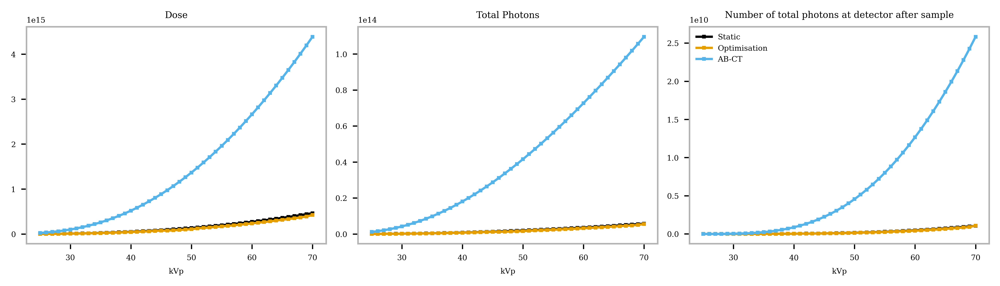

In [44]:

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

total_photons_static = [dict_sub[f'Dose_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Dose_{j}'][0] for j in spectrum_kvp]
idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Dose_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]


axs[0].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[0].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[0].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[0].set_title('Dose')
axs[0].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Total_photons_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Total_photons_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Total_photons_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]
axs[1].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[1].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[1].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[1].set_title('Total Photons')
axs[1].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Photons_detector_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Photons_detector_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Photons_detector_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]

axs[2].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[2].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[2].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[2].set_title('Number of total photons at detector after sample')
axs[2].set_xlabel('kVp')



axs[2].legend()

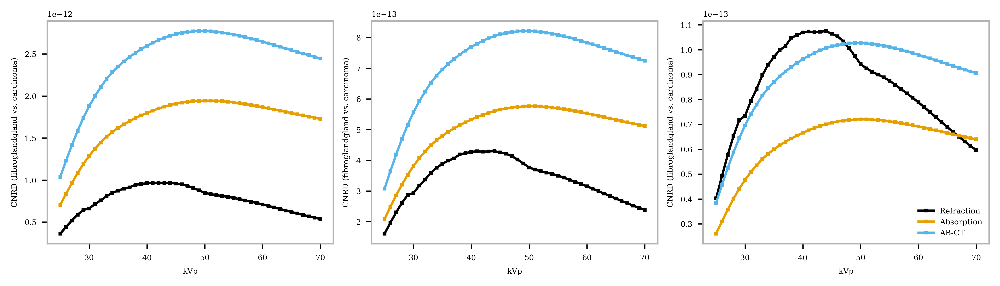

In [45]:
fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

axs[0].plot(spectrum_kvp, max_2mm_ref, label = 'Refraction')
axs[0].plot(spectrum_kvp, np.asarray(max_2mm_att), label = 'Absorption')
axs[0].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[0].set_xlabel('kVp')
axs[0].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[1].plot(spectrum_kvp, max_1mm_ref, label = 'Refraction')
axs[1].plot(spectrum_kvp, np.asarray(max_1mm_att), label = 'Absorption')
axs[1].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[1].set_xlabel('kVp')
axs[1].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].plot(spectrum_kvp, max_05mm_ref, label = 'Refraction')
axs[2].plot(spectrum_kvp, np.asarray(max_05mm_att), label = 'Absorption')
axs[2].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp], label = 'AB-CT')

axs[2].set_xlabel('kVp')
axs[2].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].legend()

## Complete plot

In [46]:
plt.rcParams['axes.grid'] = False

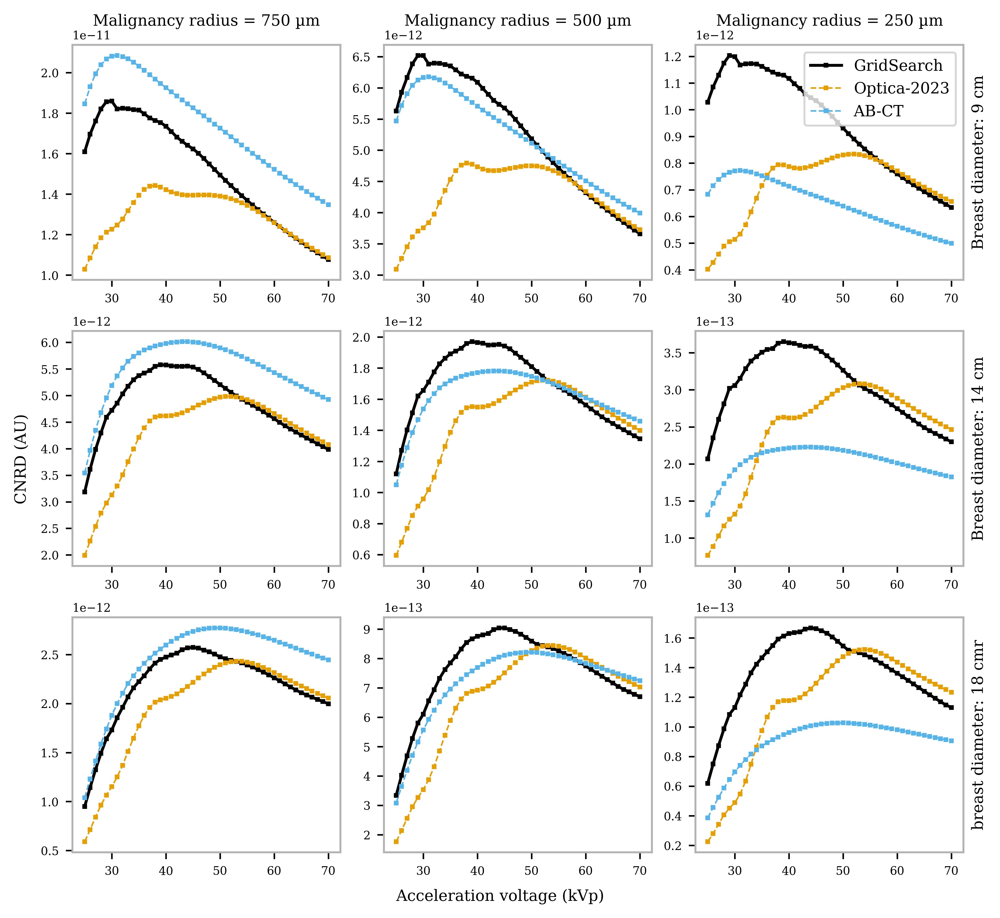

In [47]:
list_max_18 = [max_2mm, max_1mm, max_05mm]

fig, axs = plt.subplots(figsize = (7.08661, 6.5), nrows = 3, ncols = 3)
axs = axs.ravel()

corrected_rad = [750, 500, 250]

for i, rad in enumerate([2000, 1000, 500]):
    axs[i].plot(spectrum_kvp, list_max_9[i], label = 'GridSearch',)
    axs[i].plot(spectrum_kvp, CNRD_static_9[i], label = 'Optica-2023', linestyle = 'dashed', linewidth = 0.8)
    axs[i].plot(spectrum_kvp, CNRD_abct_9[i], label = 'AB-CT', linestyle = 'dashed', linewidth = 0.8)
    #axs[i].legend()
    axs[i].set_title('Malignancy radius = ' + str(corrected_rad[i]) + ' µm', fontsize = 8, pad = 10)



    axs[i+3].plot(spectrum_kvp, list_max_14[i], label = 'GridSearch',)
    axs[i+3].plot(spectrum_kvp, CNRD_static_14[i], label = 'Optica-2023', linestyle = 'dashed', linewidth = 0.8)
    axs[i+3].plot(spectrum_kvp, CNRD_abct_14[i], label = 'AB-CT', linestyle = 'dashed', linewidth = 0.8)


    axs[i+6].plot(spectrum_kvp, list_max_18[i], label = 'GridSearch',)
    axs[i+6].plot(spectrum_kvp, CNRD_static_18[i], label = 'Optica-2023', linestyle = 'dashed', linewidth = 0.8)
    axs[i+6].plot(spectrum_kvp, CNRD_abct_18[i], label = 'AB-CT', linestyle = 'dashed', linewidth = 0.8)

axs[i].legend(fontsize=8, frameon=True)

axs[2].yaxis.set_label_position("right")  # Move label position to the right
axs[2].set_ylabel("Breast diameter: 9 cm", fontsize = 8)

axs[5].yaxis.set_label_position("right")  # Move label position to the right
axs[5].set_ylabel("Breast diameter: 14 cm", fontsize = 8)

axs[8].yaxis.set_label_position("right")  # Move label position to the right
axs[8].set_ylabel("breast diameter: 18 cmr", fontsize = 8)


fig.supylabel('CNRD (AU)', fontsize=8)

# # Add labels on the left side for each row
# fig.text(-0.01, 0.78, "9 cm breast", va='center', rotation='vertical', fontsize=8)
# fig.text(-0.01, 0.51, "14 cm breast", va='center', rotation='vertical', fontsize=8)
# fig.text(-0.01, 0.24, "18 cm breast", va='center', rotation='vertical', fontsize=8)
for ax in axs:
    ax.tick_params(axis='both', which='major', labelsize=6)  # Adjust tick label size
    ax.yaxis.get_offset_text().set_fontsize(6)  # Adjust offset text size

fig.supxlabel('Acceleration voltage (kVp)', fontsize = 8)
fig.supylabel('CNRD (AU)', fontsize = 8)
#fig.suptitle('2m system')
#plt.savefig('data/2m_CNRD_carcinoma_fibrogland_pxScaled.eps', bbox_inches = 'tight', format = 'eps', dpi = 600)
plt.show()

In [48]:
from matplotlib.lines import Line2D

# Your custom markers and labels
custom_markers = [
    Line2D([0], [0], color="#000000", label='Refraction CNRD GI'),
    Line2D([0], [0], color="#E69F00", label='Absorption CNRD GI'),
    Line2D([0], [0], color="#56B4E9", label='nu:view'),
    Line2D([0], [0], marker='o', color="#000000",  markersize=2,  linestyle='None',label='16cm'),
    Line2D([0], [0], marker='s', color="#000000",  markersize=2,  linestyle='None',label='10cm'),
    Line2D([0], [0], marker='^', color="#000000",  markersize=2,  linestyle='None',label='20cm'),
]

# System to use: 1.45m 

In [49]:
AR = 50
design_eng = np.linspace(20000, 46000, 27)
p0_iterate = np.arange(3, 10, 0.1)*1e-6
TO = np.array([1,3,5,7])
p0s = []
p1s = []
p2s = []
TOs = []
D = []
S = []
L = []
z_g0s = []
sensitivity = []
eng_used = []
heights = []
heights_g1 = []
sample_positions = []
gold_heights_per_eng = 3/mu_au(design_eng)

for to in TO:
    for idx, eng in enumerate(design_eng):
        for p in p0_iterate:
            try:

                height = p*AR/2
            
                if height < gold_heights_per_eng[idx] or height < 120e-6:
                    continue
                p1, p2, d, s = calculate_td_symmetric(eng, p, to)
                
                if (s + 0.15) > 1.3 + 0.15:
                    continue
                
                heights_g1.append(calculate_G1_height(eng))
                heights.append(height)
                p0s.append(p)
                p1s.append(p1)
                p2s.append(p2)
                D.append(d)
                S.append(s)
                L.append(d)
                sensitivity.append(p2 / (2*np.pi*d))
                eng_used.append(eng)
                TOs.append(to)
                z_g0s.append(0.15)
                sample_positions.append(1)
                
            except:
                continue

p1, p2, d, s = calculate_td(46000, 4.2*1e-6, 0.8180881351464869, 5)
p0s.append(4.2*1e-6)
p1s.append(p1)
p2s.append(p2)
D.append(d)
S.append(s)
L.append(0.8180881351464869)
eng_used.append(46000)
sensitivity.append(p2 / (2*np.pi*d))
TOs.append(5)
heights.append(180e-6)
heights_g1.append(calculate_G1_height(46000))
z_g0s.append(0.1)
sample_positions.append(1)



parameters_dict = {'p0': np.asarray(p0s),
                  'p1': np.asarray(p1s),
                  'p2': np.asarray(p2s),
                  'D': np.asarray(D),
                  'S': np.asarray(S),
                  'L': np.asarray(L),
                  'eng': np.asarray(eng_used),
                  'TO': np.asarray(TOs),
                  'height': np.asarray(heights),
                  'height_g1': np.asarray(heights_g1),
                  'z_g0': np.asarray(z_g0s),
                  'sample_pos': np.asarray(sample_positions)}


In [50]:
dict_sub, _, interception_radii = calculate_constraints_FOV(parameters_dict, 0.15)
#dict_sub, _ = calculate_constraints_FOV(parameters_dict, 0.15)


In [51]:
len(dict_sub['p0'])

392

In [52]:
dict_sub['D'][-1]

0.8180881351464867

## Breast size 14cm

In [53]:
max_2mm = []
max_1_5mm = []
max_1mm = []
max_05mm = []

max_2mm_ref = []
max_1mm_ref = []
max_1_5mm_ref = []
max_05mm_ref = []

max_2mm_att = []
max_1mm_att = []
max_1_5mm_att = []
max_05mm_att = []

breast_size = 0.14

for i in tqdm.tqdm(spectrum_kvp):

    spec_txt = tube_dict[i]
    mu_breast_tissue = mu_dict[i]
    mu_au_ = mu_au_dict[i]
    mu_si_ = mu_si_dict[i]
    delta_breast_tissue = delta_dict[i]
    energies = np.arange(15, i+0.25, 0.25)*1e3
    
    mu_d_adi_gland = lambda E: _t("mu", fibrogland, carcinoma, E*cnst.e)
    delta_d_adi_gland = lambda E: _t("delta", fibrogland, carcinoma, E*cnst.e)
    
    V_totals = []
    V_sample = []
    critical_radius = []
    total_photons = []
    int_detector = []
    doses = []


    CNRD_commercial, tot_photons, int_d, dose = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00075, 0.2)
    dict_sub[f'CNRD_commercial_{i}_2000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.0005, 0.2)
    dict_sub[f'CNRD_commercial_{i}_1000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00025, 0.2)
    dict_sub[f'CNRD_commercial_{i}_500um'] = CNRD_commercial

    doses.append(dose)
    total_photons.append(tot_photons)
    int_detector.append(int_d)

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, V_total, V_s, crit_radius, tot_photons, int_d, dose  = effective_energy_CNRD_opening_angle(spec_txt, energies, 
                                                                                                                             d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                                                             mu_d_adi_gland, mu_breast_tissue, breast_size, 
                                                                                                                             p, d, l, s, 0.0005, 0.2, z_g0,height = height, 
                                                                                                                             height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)
        critical_radius.append(crit_radius)
        total_photons.append(tot_photons)
        int_detector.append(int_d)
        doses.append(dose)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_1000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_1000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_1000um"] = CNRDs_att




    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, 
                                                                                          delta_d_adi_gland, mu_d_adi_gland, mu_breast_tissue, 
                                                                                          breast_size, p, d, l, s, 0.00075, 0.2, z_g0,height = height, 
                                                                                          height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_2000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_2000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_2000um"] = CNRDs_att

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []
    
    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                          mu_d_adi_gland, mu_breast_tissue, breast_size, p, d, l, s, 0.00025, 0.2, 
                                                                                          z_g0,height = height, height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_500um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_500um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_500um"] = CNRDs_att
    
    dict_sub[f"V_total_{i}"] = np.asarray(V_totals)
    dict_sub[f"V_Sample_{i}"] = np.asarray(V_sample)
    dict_sub[f"critical_radius_{i}"] = np.asarray(critical_radius)
    dict_sub[f"Total_photons_{i}"] = np.asarray(total_photons)
    dict_sub[f"Photons_detector_{i}"] = np.asarray(int_detector)
    dict_sub[f"Dose_{i}"] = np.asarray(doses)

    max_1mm.append(np.max(dict_sub[f"CNRD_{i}_1000um"][:-2]))
    # max_1_5mm.append(np.max(dict_sub[f"CNRD_{i}_1500um"][:-2]))
    max_2mm.append(np.max(dict_sub[f"CNRD_{i}_2000um"][:-2]))
    max_05mm.append(np.max(dict_sub[f"CNRD_{i}_500um"][:-2]))
    
    max_1mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1000um"][:-2]))
    max_05mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_500um"][:-2]))
    # max_1_5mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1500um"][:-2]))
    max_2mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_2000um"][:-2]))

    
    
    max_1mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1000um"][:-2]))
    max_05mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_500um"][:-2]))
    max_2mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_2000um"][:-2]))
    # max_1_5mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1500um"][:-2]))

    
    # # max_05mm_att.append(np.max(dict_sub['CNRD_att_500um']))
    

100%|██████████| 46/46 [00:09<00:00,  5.11it/s]


Text(0.5, 1.0, 'Critical radius per kVp')

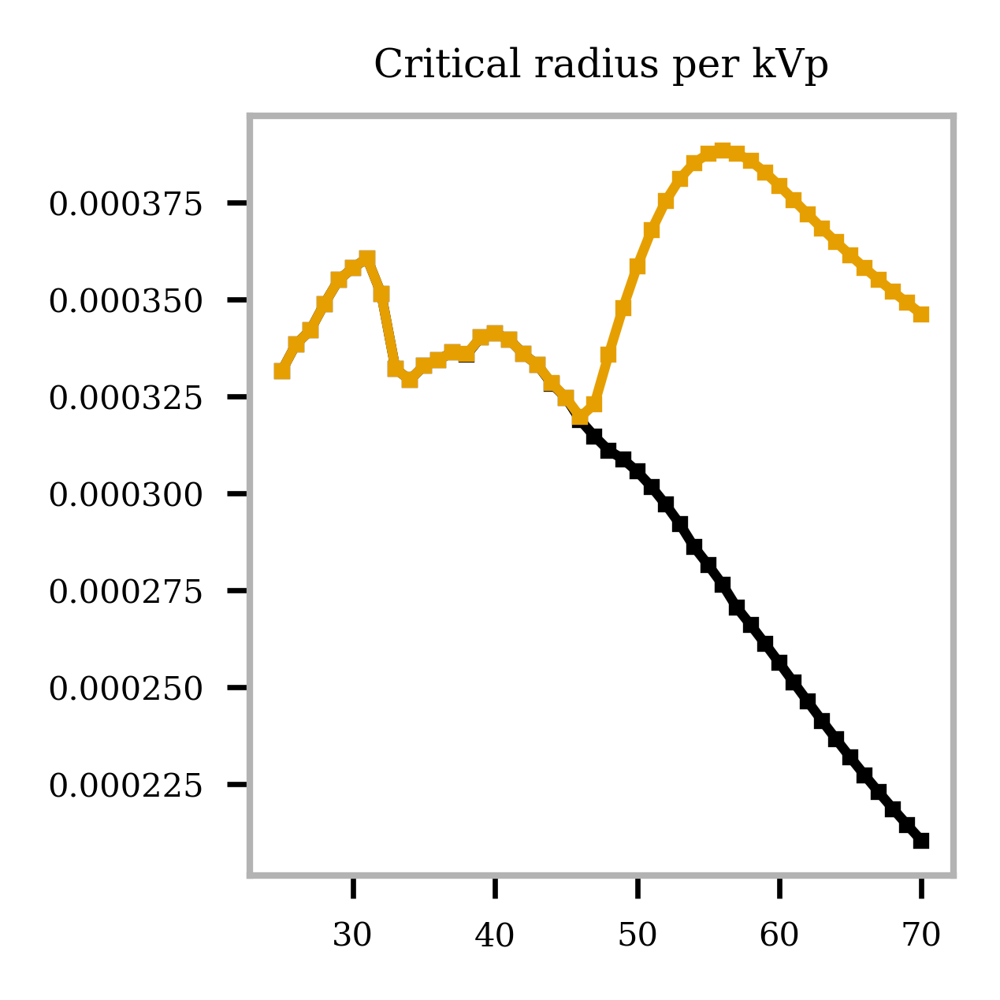

In [54]:
plt.figure(figsize=(2,2))
max_radius_best_system = [dict_sub[f'critical_radius_{i}'][np.argmax(dict_sub[f'CNRD_{i}_500um'][:-1])] for i in spectrum_kvp]
max_radius = [np.max(dict_sub[f'critical_radius_{i}']) for i in spectrum_kvp]
plt.plot(spectrum_kvp, np.asarray(max_radius_best_system))
plt.plot(spectrum_kvp, np.asarray(max_radius))

plt.title('Critical radius per kVp')

In [55]:
spectrum_kvp[np.argmax(max_05mm)]

41

In [56]:
for kvp in spectrum_kvp:
    idx_max = np.argmax(dict_sub[f'CNRD_{kvp}_500um'][:-1])
    print('----------------------------')
    print('kvp: ', kvp)
    print('idx_max', idx_max)
    for key in dict_sub.keys():
        if 'CNR' in key and key != f'CNRD_{kvp}_500um':
            continue
        if 'V_total' in key and key != f'V_total_{kvp}':
            continue
        if 'V_Sample'in key and key != f'V_Sample_{kvp}':
            continue
        if 'Total_photons' in key and key != f'Total_photons_{kvp}':
            continue
        if 'critical_radius' in key and key != f'critical_radius_{kvp}':
            continue
        if 'Photons_detector' in key and key != f'Photons_detector_{kvp}':
            continue
        if 'Dose' in key and key != f'Dose_{kvp}':
            continue
        print(f"{key}: ", dict_sub[key][idx_max])

----------------------------
kvp:  25
idx_max 380
p0:  5.200000000000002e-06
p1:  5.200000000000002e-06
p2:  5.200000000000002e-06
D:  0.6270153960986686
S:  1.2540307921973373
L:  0.6270153960986686
eng:  23000.0
TO:  5
height:  0.00013000000000000004
height_g1:  2.9350722612621482e-05
z_g0:  0.15
sample_pos:  1
CNRD_25_500um:  1.799061001863587e-13
V_total_25:  0.28809508592862654
V_Sample_25:  0.376926671380454
critical_radius_25:  0.00033152384872387315
Total_photons_25:  51179761062.42426
Photons_detector_25:  416903.3411816042
Dose_25:  2432743348830.201
----------------------------
kvp:  26
idx_max 384
p0:  5.100000000000001e-06
p1:  5.100000000000001e-06
p2:  5.100000000000001e-06
D:  0.6293544038793297
S:  1.2587088077586595
L:  0.6293544038793297
eng:  24000.0
TO:  5
height:  0.00012750000000000004
height_g1:  3.063562040963009e-05
z_g0:  0.15
sample_pos:  1
CNRD_26_500um:  2.0466061494795636e-13
V_total_26:  0.2760532568229136
V_Sample_26:  0.37099585541193325
critical_radiu

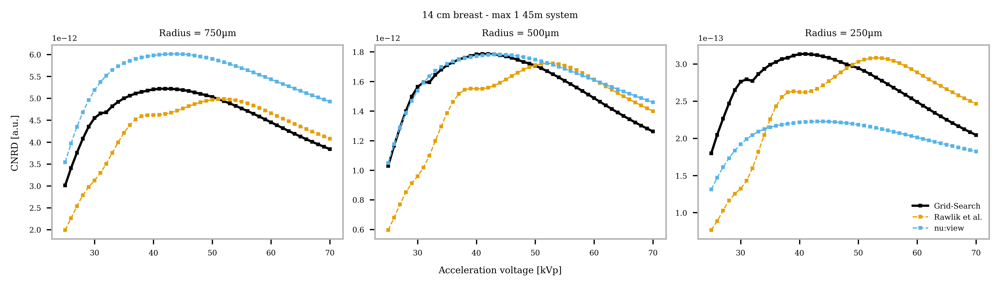

In [57]:
list_max_14 = [max_2mm, max_1mm, max_05mm]

corrected_rad = [750, 500, 250]

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

for i, rad in enumerate([2000, 1000, 500]):
    CNR_per_energy_static = [dict_sub[f'CNRD_{j}_{rad}um'][-1] for j in spectrum_kvp]
    axs[i].plot(spectrum_kvp, list_max_14[i], label = 'Grid-Search',)
    axs[i].plot(spectrum_kvp, CNR_per_energy_static, label = 'Rawlik et al.', linestyle = 'dashed', linewidth = 0.8)
    axs[i].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_{rad}um'] for j in spectrum_kvp], label = 'nu:view', linestyle = 'dashed', linewidth = 0.8)
    #axs[i].legend()
    axs[i].set_title('Radius = ' + str(corrected_rad[i]) + 'µm')
    #axs[i].axvline(50)

    #axs[i].axvline(46)
axs[i].legend()
fig.supxlabel('Acceleration voltage [kVp]')
fig.supylabel('CNRD [a.u.]')
fig.suptitle('14 cm breast - max 1 45m system')
#plt.savefig('data/1_45m_CNRD_carcinoma_fibrogland_14cm_breast_pxScaled.png', bbox_inches = 'tight')
plt.show()

CNRD_static_2000_14 = [dict_sub[f'CNRD_{j}_2000um'][-1] for j in spectrum_kvp]
CNRD_static_1000_14 = [dict_sub[f'CNRD_{j}_1000um'][-1] for j in spectrum_kvp]
CNRD_static_500_14 = [dict_sub[f'CNRD_{j}_500um'][-1] for j in spectrum_kvp]

CNRD_static_14 = [CNRD_static_2000_14, CNRD_static_1000_14, CNRD_static_500_14]

CNRD_abct_2000_14 = [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp]
CNRD_abct_1000_14 = [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp]
CNRD_abct_500_14 = [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp]

CNRD_abct_14 = [CNRD_abct_2000_14, CNRD_abct_1000_14, CNRD_abct_500_14]


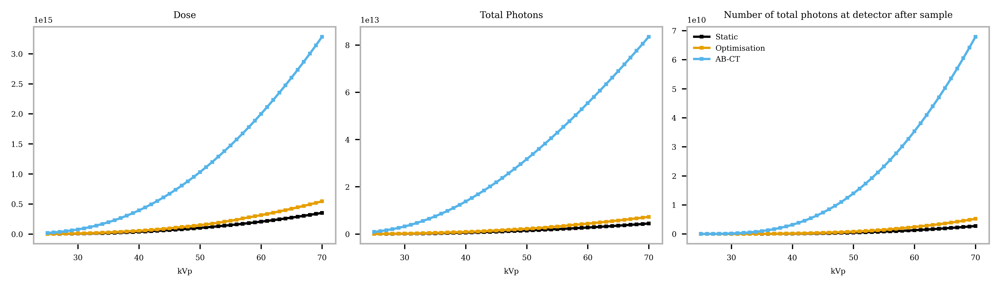

In [58]:

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

total_photons_static = [dict_sub[f'Dose_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Dose_{j}'][0] for j in spectrum_kvp]
idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Dose_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]


axs[0].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[0].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[0].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[0].set_title('Dose')
axs[0].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Total_photons_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Total_photons_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Total_photons_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]
axs[1].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[1].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[1].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[1].set_title('Total Photons')
axs[1].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Photons_detector_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Photons_detector_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Photons_detector_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]

axs[2].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[2].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[2].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[2].set_title('Number of total photons at detector after sample')
axs[2].set_xlabel('kVp')



axs[2].legend()

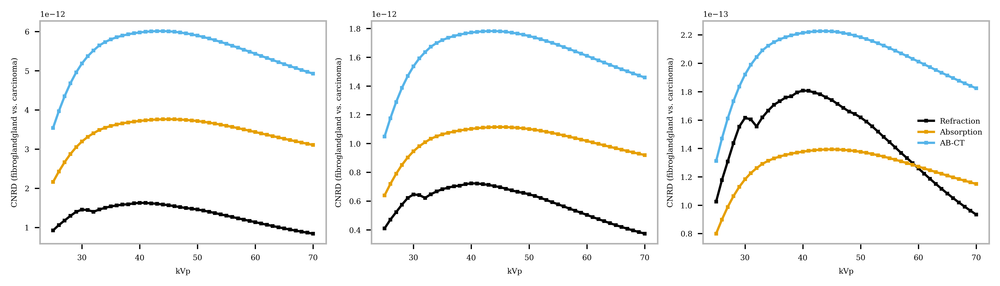

In [59]:
fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

axs[0].plot(spectrum_kvp, max_2mm_ref, label = 'Refraction')
axs[0].plot(spectrum_kvp, np.asarray(max_2mm_att), label = 'Absorption')
axs[0].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[0].set_xlabel('kVp')
axs[0].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[1].plot(spectrum_kvp, max_1mm_ref, label = 'Refraction')
axs[1].plot(spectrum_kvp, np.asarray(max_1mm_att), label = 'Absorption')
axs[1].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[1].set_xlabel('kVp')
axs[1].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].plot(spectrum_kvp, max_05mm_ref, label = 'Refraction')
axs[2].plot(spectrum_kvp, np.asarray(max_05mm_att), label = 'Absorption')
axs[2].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp], label = 'AB-CT')

axs[2].set_xlabel('kVp')
axs[2].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].legend()

## 9cm breast

In [60]:
max_2mm = []
max_1_5mm = []
max_1mm = []
max_05mm = []

max_2mm_ref = []
max_1mm_ref = []
max_1_5mm_ref = []
max_05mm_ref = []

max_2mm_att = []
max_1mm_att = []
max_1_5mm_att = []
max_05mm_att = []

breast_size = 0.09

for i in tqdm.tqdm(spectrum_kvp):

    spec_txt = tube_dict[i]
    mu_breast_tissue = mu_dict[i]
    mu_au_ = mu_au_dict[i]
    mu_si_ = mu_si_dict[i]
    delta_breast_tissue = delta_dict[i]
    energies = np.arange(15, i+0.25, 0.25)*1e3
    
    mu_d_adi_gland = lambda E: _t("mu", fibrogland, carcinoma, E*cnst.e)
    delta_d_adi_gland = lambda E: _t("delta", fibrogland, carcinoma, E*cnst.e)
    
    V_totals = []
    V_sample = []
    critical_radius = []
    total_photons = []
    int_detector = []
    doses = []


    CNRD_commercial, tot_photons, int_d, dose = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00075, 0.2)
    dict_sub[f'CNRD_commercial_{i}_2000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.0005, 0.2)
    dict_sub[f'CNRD_commercial_{i}_1000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00025, 0.2)
    dict_sub[f'CNRD_commercial_{i}_500um'] = CNRD_commercial

    doses.append(dose)
    total_photons.append(tot_photons)
    int_detector.append(int_d)

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, V_total, V_s, crit_radius, tot_photons, int_d, dose  = effective_energy_CNRD_opening_angle(spec_txt, energies, 
                                                                                                                             d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                                                             mu_d_adi_gland, mu_breast_tissue, breast_size, 
                                                                                                                             p, d, l, s, 0.0005, 0.2, z_g0,height = height, 
                                                                                                                             height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)
        critical_radius.append(crit_radius)
        total_photons.append(tot_photons)
        int_detector.append(int_d)
        doses.append(dose)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_1000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_1000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_1000um"] = CNRDs_att




    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, 
                                                                                          delta_d_adi_gland, mu_d_adi_gland, mu_breast_tissue, 
                                                                                          breast_size, p, d, l, s, 0.00075, 0.2, z_g0,height = height, 
                                                                                          height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_2000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_2000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_2000um"] = CNRDs_att

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []
    
    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                          mu_d_adi_gland, mu_breast_tissue, breast_size, p, d, l, s, 0.00025, 0.2, 
                                                                                          z_g0,height = height, height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_500um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_500um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_500um"] = CNRDs_att
    
    dict_sub[f"V_total_{i}"] = np.asarray(V_totals)
    dict_sub[f"V_Sample_{i}"] = np.asarray(V_sample)
    dict_sub[f"critical_radius_{i}"] = np.asarray(critical_radius)
    dict_sub[f"Total_photons_{i}"] = np.asarray(total_photons)
    dict_sub[f"Photons_detector_{i}"] = np.asarray(int_detector)
    dict_sub[f"Dose_{i}"] = np.asarray(doses)

    max_1mm.append(np.max(dict_sub[f"CNRD_{i}_1000um"][:-2]))
    # max_1_5mm.append(np.max(dict_sub[f"CNRD_{i}_1500um"][:-2]))
    max_2mm.append(np.max(dict_sub[f"CNRD_{i}_2000um"][:-2]))
    max_05mm.append(np.max(dict_sub[f"CNRD_{i}_500um"][:-2]))
    
    max_1mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1000um"][:-2]))
    max_05mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_500um"][:-2]))
    # max_1_5mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1500um"][:-2]))
    max_2mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_2000um"][:-2]))

    
    
    max_1mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1000um"][:-2]))
    max_05mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_500um"][:-2]))
    max_2mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_2000um"][:-2]))
    # max_1_5mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1500um"][:-2]))

    
    # # max_05mm_att.append(np.max(dict_sub['CNRD_att_500um']))
    

  0%|          | 0/46 [00:00<?, ?it/s]

100%|██████████| 46/46 [00:09<00:00,  5.02it/s]


Text(0.5, 1.0, 'Critical radius per kVp')

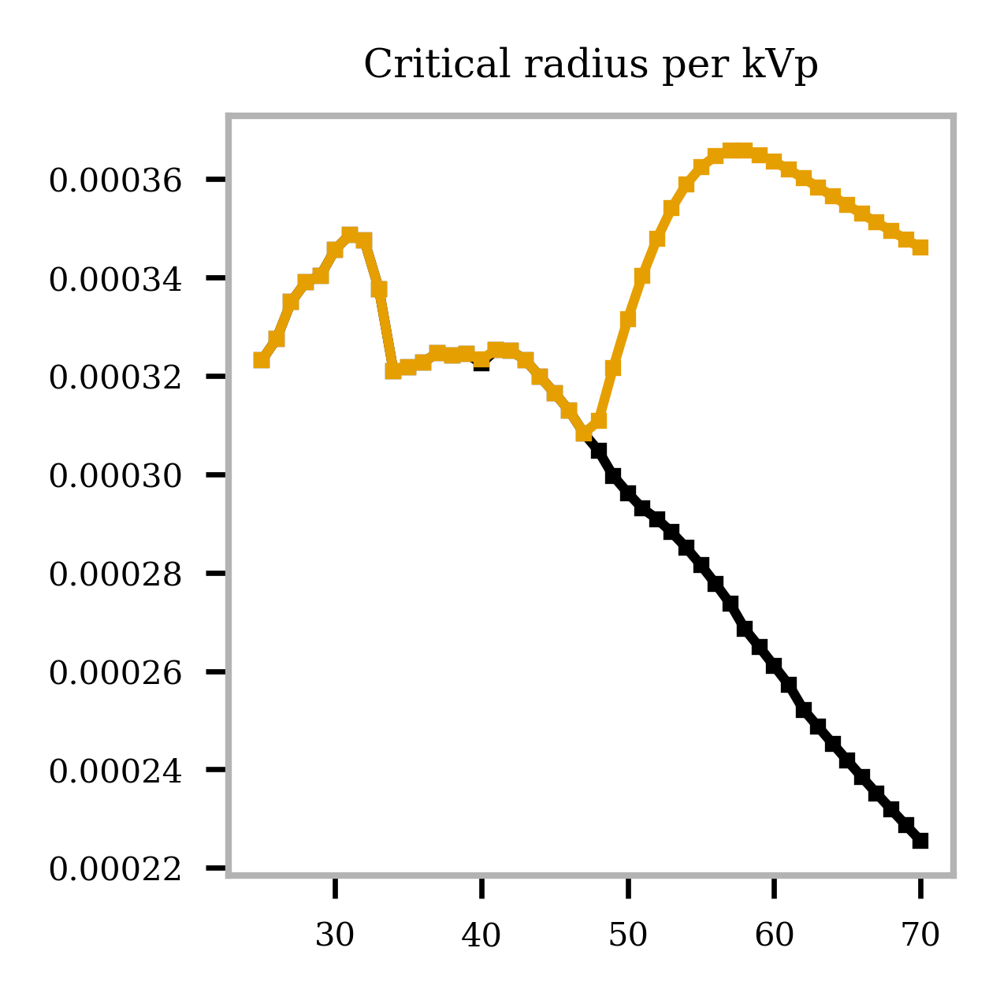

In [61]:
plt.figure(figsize=(2,2))
max_radius_best_system = [dict_sub[f'critical_radius_{i}'][np.argmax(dict_sub[f'CNRD_{i}_500um'][:-1])] for i in spectrum_kvp]
max_radius = [np.max(dict_sub[f'critical_radius_{i}']) for i in spectrum_kvp]
plt.plot(spectrum_kvp, np.asarray(max_radius_best_system))
plt.plot(spectrum_kvp, np.asarray(max_radius))

plt.title('Critical radius per kVp')

In [62]:
spectrum_kvp[np.argmax(max_05mm)]

30

In [63]:
for kvp in spectrum_kvp:
    idx_max = np.argmax(dict_sub[f'CNRD_{kvp}_500um'][:-1])
    print('----------------------------')
    print('kvp: ', kvp)
    for key in dict_sub.keys():
        if 'CNR' in key and key != f'CNRD_{kvp}_500um':
            continue
        if 'V_total' in key and key != f'V_total_{kvp}':
            continue
        if 'V_Sample'in key and key != f'V_Sample_{kvp}':
            continue
        if 'Total_photons' in key and key != f'Total_photons_{kvp}':
            continue
        if 'critical_radius' in key and key != f'critical_radius_{kvp}':
            continue
        if 'Photons_detector' in key and key != f'Photons_detector_{kvp}':
            continue
        if 'Dose' in key and key != f'Dose_{kvp}':
            continue
        print(f"{key}: ", dict_sub[key][idx_max])

----------------------------
kvp:  25
p0:  5.200000000000002e-06
p1:  5.200000000000002e-06
p2:  5.200000000000002e-06
D:  0.6270153960986686
S:  1.2540307921973373
L:  0.6270153960986686
eng:  23000.0
TO:  5
height:  0.00013000000000000004
height_g1:  2.9350722612621482e-05
z_g0:  0.15
sample_pos:  1
CNRD_25_500um:  9.107155859711671e-13
V_total_25:  0.28809508592862654
V_Sample_25:  0.3616493786624871
critical_radius_25:  0.00032313156932184964
Total_photons_25:  32704732743.316162
Photons_detector_25:  6280339.0225895075
Dose_25:  1547014441065.673
----------------------------
kvp:  26
p0:  5.200000000000002e-06
p1:  5.200000000000002e-06
p2:  5.200000000000002e-06
D:  0.6270153960986686
S:  1.2540307921973373
L:  0.6270153960986686
eng:  23000.0
TO:  5
height:  0.00013000000000000004
height_g1:  2.9350722612621482e-05
z_g0:  0.15
sample_pos:  1
CNRD_26_500um:  9.626283118639697e-13
V_total_26:  0.30150009925675214
V_Sample_26:  0.35516067759727693
critical_radius_26:  0.00032748344

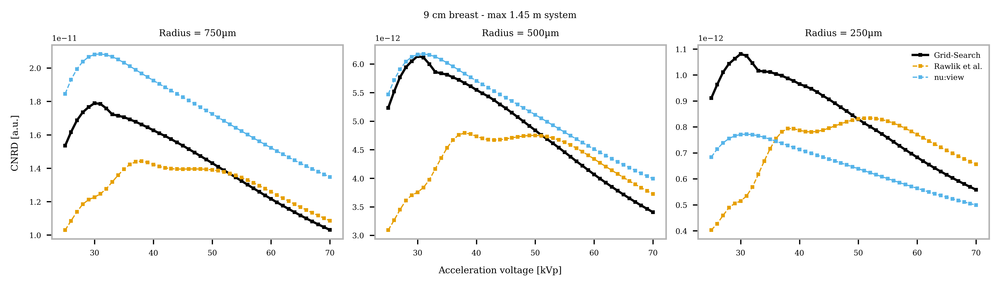

In [65]:
list_max_9 = [max_2mm, max_1mm, max_05mm]

corrected_rad = [750, 500, 250]

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

for i, rad in enumerate([2000, 1000, 500]):
    CNR_per_energy_static = [dict_sub[f'CNRD_{j}_{rad}um'][-1] for j in spectrum_kvp]
    axs[i].plot(spectrum_kvp, list_max_9[i], label = 'Grid-Search',)
    axs[i].plot(spectrum_kvp, CNR_per_energy_static, label = 'Rawlik et al.', linestyle = 'dashed', linewidth = 0.8)
    axs[i].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_{rad}um'] for j in spectrum_kvp], label = 'nu:view', linestyle = 'dashed', linewidth = 0.8)
    #axs[i].legend()
    axs[i].set_title('Radius = ' + str(corrected_rad[i]) + 'µm')
    #axs[i].axvline(50)

    #axs[i].axvline(46)
axs[i].legend()
fig.supxlabel('Acceleration voltage [kVp]')
fig.supylabel('CNRD [a.u.]')
fig.suptitle('9 cm breast - max 1.45 m system')
plt.show()

CNRD_static_2000_9 = [dict_sub[f'CNRD_{j}_2000um'][-1] for j in spectrum_kvp]
CNRD_static_1000_9 = [dict_sub[f'CNRD_{j}_1000um'][-1] for j in spectrum_kvp]
CNRD_static_500_9 = [dict_sub[f'CNRD_{j}_500um'][-1] for j in spectrum_kvp]

CNRD_static_9 = [CNRD_static_2000_9, CNRD_static_1000_9, CNRD_static_500_9]

CNRD_abct_2000_9 = [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp]
CNRD_abct_1000_9 = [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp]
CNRD_abct_500_9 = [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp]

CNRD_abct_9 = [CNRD_abct_2000_9, CNRD_abct_1000_9, CNRD_abct_500_9]

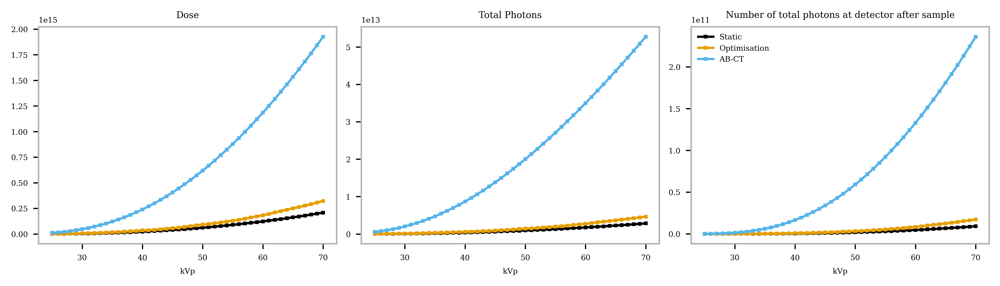

In [66]:

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

total_photons_static = [dict_sub[f'Dose_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Dose_{j}'][0] for j in spectrum_kvp]
idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Dose_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]


axs[0].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[0].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[0].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[0].set_title('Dose')
axs[0].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Total_photons_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Total_photons_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Total_photons_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]
axs[1].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[1].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[1].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[1].set_title('Total Photons')
axs[1].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Photons_detector_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Photons_detector_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Photons_detector_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]

axs[2].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[2].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[2].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[2].set_title('Number of total photons at detector after sample')
axs[2].set_xlabel('kVp')



axs[2].legend()

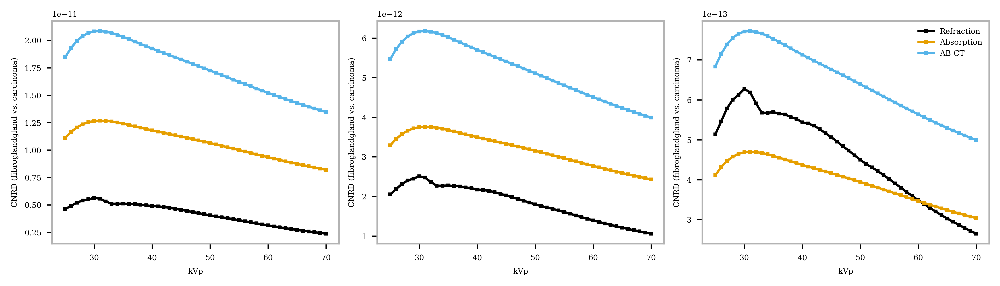

In [67]:
fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

axs[0].plot(spectrum_kvp, max_2mm_ref, label = 'Refraction')
axs[0].plot(spectrum_kvp, np.asarray(max_2mm_att), label = 'Absorption')
axs[0].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[0].set_xlabel('kVp')
axs[0].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[1].plot(spectrum_kvp, max_1mm_ref, label = 'Refraction')
axs[1].plot(spectrum_kvp, np.asarray(max_1mm_att), label = 'Absorption')
axs[1].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[1].set_xlabel('kVp')
axs[1].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].plot(spectrum_kvp, max_05mm_ref, label = 'Refraction')
axs[2].plot(spectrum_kvp, np.asarray(max_05mm_att), label = 'Absorption')
axs[2].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp], label = 'AB-CT')

axs[2].set_xlabel('kVp')
axs[2].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].legend()

## 18cm breast

In [68]:
max_2mm = []
max_1_5mm = []
max_1mm = []
max_05mm = []

max_2mm_ref = []
max_1mm_ref = []
max_1_5mm_ref = []
max_05mm_ref = []

max_2mm_att = []
max_1mm_att = []
max_1_5mm_att = []
max_05mm_att = []

breast_size = 0.18

for i in tqdm.tqdm(spectrum_kvp):

    spec_txt = tube_dict[i]
    mu_breast_tissue = mu_dict[i]
    mu_au_ = mu_au_dict[i]
    mu_si_ = mu_si_dict[i]
    delta_breast_tissue = delta_dict[i]
    energies = np.arange(15, i+0.25, 0.25)*1e3
    
    mu_d_adi_gland = lambda E: _t("mu", fibrogland, carcinoma, E*cnst.e)
    delta_d_adi_gland = lambda E: _t("delta", fibrogland, carcinoma, E*cnst.e)
    
    V_totals = []
    V_sample = []
    critical_radius = []
    total_photons = []
    int_detector = []
    doses = []


    CNRD_commercial, tot_photons, int_d, dose = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00075, 0.2)
    dict_sub[f'CNRD_commercial_{i}_2000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.0005, 0.2)
    dict_sub[f'CNRD_commercial_{i}_1000um'] = CNRD_commercial
    CNRD_commercial, _, _, _ = attenuation_based_CNRD_opening_angle(spec_txt, energies, mu_d_adi_gland, mu_breast_tissue, breast_size, 0.5, 0.65, 0.00025, 0.2)
    dict_sub[f'CNRD_commercial_{i}_500um'] = CNRD_commercial

    doses.append(dose)
    total_photons.append(tot_photons)
    int_detector.append(int_d)

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, V_total, V_s, crit_radius, tot_photons, int_d, dose  = effective_energy_CNRD_opening_angle(spec_txt, energies, 
                                                                                                                             d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                                                             mu_d_adi_gland, mu_breast_tissue, breast_size, 
                                                                                                                             p, d, l, s, 0.0005, 0.2, z_g0,height = height, 
                                                                                                                             height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)
        critical_radius.append(crit_radius)
        total_photons.append(tot_photons)
        int_detector.append(int_d)
        doses.append(dose)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_1000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_1000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_1000um"] = CNRDs_att




    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []

    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, 
                                                                                          delta_d_adi_gland, mu_d_adi_gland, mu_breast_tissue, 
                                                                                          breast_size, p, d, l, s, 0.00075, 0.2, z_g0,height = height, 
                                                                                          height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)
        V_totals.append(V_total)
        V_sample.append(V_s)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_2000um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_2000um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_2000um"] = CNRDs_att

    CNRDs = []
    CNRDs_ref = []
    CNRDs_att = []
    
    for k in range(dict_sub['p0'].shape[0]):
        p = dict_sub['p2'][k]
        s = dict_sub['S'][k]
        l = dict_sub['L'][k]
        d = dict_sub['D'][k]
        d_eng = dict_sub['eng'][k]
        TO = dict_sub['TO'][k]
        z_g0 = dict_sub['z_g0'][k]
        height = dict_sub['height'][k]
        height_g1 = dict_sub['height_g1'][k]
        sample_pos = dict_sub['sample_pos'][k]
        CNRD, CNRD_ref, CNRD_att, _, _, _, _, _, _  = effective_energy_CNRD_opening_angle(spec_txt, energies, d_eng, TO, mu_au_, mu_si_, delta_d_adi_gland, 
                                                                                          mu_d_adi_gland, mu_breast_tissue, breast_size, p, d, l, s, 0.00025, 0.2, 
                                                                                          z_g0,height = height, height_g1 = height_g1, sample_pos = sample_pos)
        CNRDs_ref.append(CNRD_ref)
        CNRDs_att.append(CNRD_att)
        CNRDs.append(CNRD)

    CNRDs = np.asarray(CNRDs)
    CNRDs_ref = np.asarray(CNRDs_ref)
    CNRDs_att = np.asarray(CNRDs_att)
    
    dict_sub[f"CNRD_{i}_500um"] = CNRDs
    dict_sub[f"CNRD_ref_{i}_500um"] = CNRDs_ref
    dict_sub[f"CNRD_att_{i}_500um"] = CNRDs_att
    
    dict_sub[f"V_total_{i}"] = np.asarray(V_totals)
    dict_sub[f"V_Sample_{i}"] = np.asarray(V_sample)
    dict_sub[f"critical_radius_{i}"] = np.asarray(critical_radius)
    dict_sub[f"Total_photons_{i}"] = np.asarray(total_photons)
    dict_sub[f"Photons_detector_{i}"] = np.asarray(int_detector)
    dict_sub[f"Dose_{i}"] = np.asarray(doses)

    max_1mm.append(np.max(dict_sub[f"CNRD_{i}_1000um"][:-2]))
    # max_1_5mm.append(np.max(dict_sub[f"CNRD_{i}_1500um"][:-2]))
    max_2mm.append(np.max(dict_sub[f"CNRD_{i}_2000um"][:-2]))
    max_05mm.append(np.max(dict_sub[f"CNRD_{i}_500um"][:-2]))
    
    max_1mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1000um"][:-2]))
    max_05mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_500um"][:-2]))
    # max_1_5mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_1500um"][:-2]))
    max_2mm_ref.append(np.max(dict_sub[f"CNRD_ref_{i}_2000um"][:-2]))

    
    
    max_1mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1000um"][:-2]))
    max_05mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_500um"][:-2]))
    max_2mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_2000um"][:-2]))
    # max_1_5mm_att.append(np.max(dict_sub[f"CNRD_att_{i}_1500um"][:-2]))

    
    # # max_05mm_att.append(np.max(dict_sub['CNRD_att_500um']))
    

100%|██████████| 46/46 [00:09<00:00,  4.98it/s]


Text(0.5, 1.0, 'Critical radius per kVp')

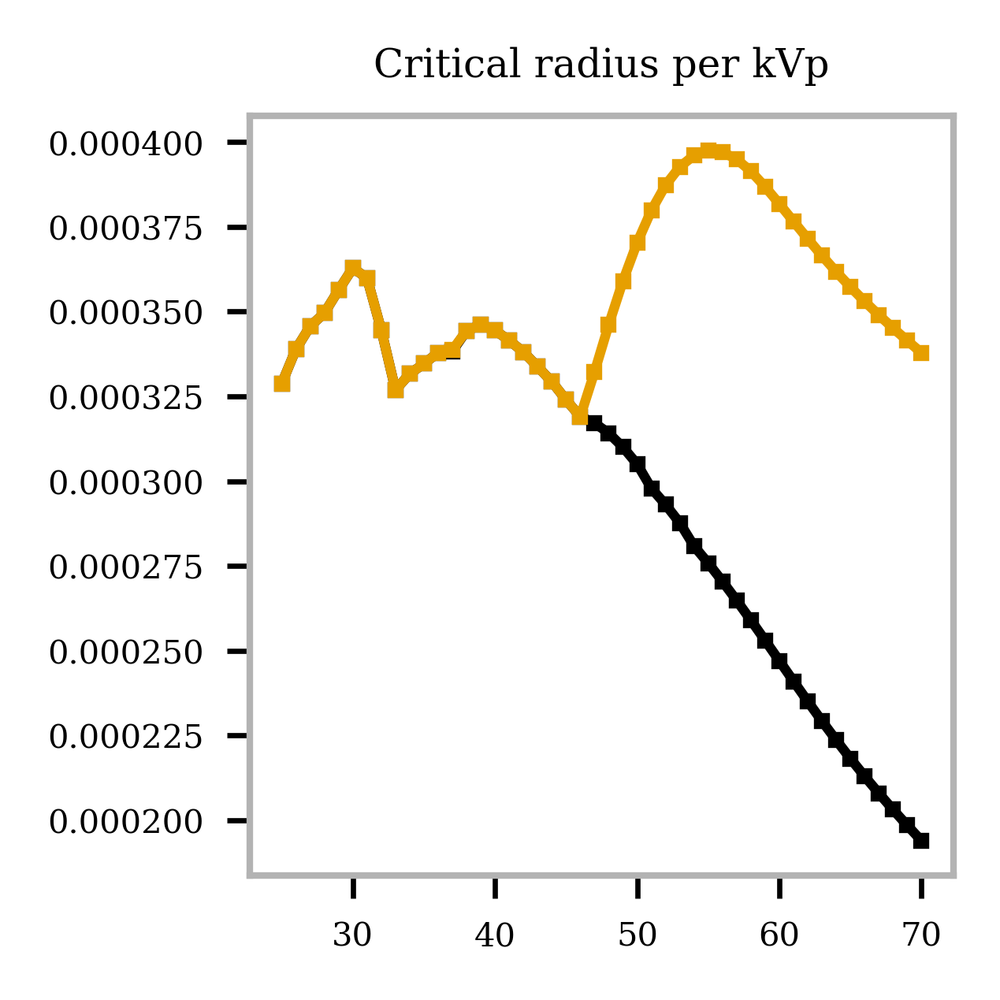

In [69]:
plt.figure(figsize=(2,2))
max_radius_best_system = [dict_sub[f'critical_radius_{i}'][np.argmax(dict_sub[f'CNRD_{i}_500um'][:-1])] for i in spectrum_kvp]
max_radius = [np.max(dict_sub[f'critical_radius_{i}']) for i in spectrum_kvp]
plt.plot(spectrum_kvp, np.asarray(max_radius_best_system))
plt.plot(spectrum_kvp, np.asarray(max_radius))

plt.title('Critical radius per kVp')

In [70]:
for kvp in spectrum_kvp:
    idx_max = np.argmax(dict_sub[f'CNRD_{kvp}_500um'][:-1])
    print('----------------------------')
    print('kvp: ', kvp)
    for key in dict_sub.keys():
        if 'CNR' in key and key != f'CNRD_{kvp}_500um':
            continue
        if 'V_total' in key and key != f'V_total_{kvp}':
            continue
        if 'V_Sample'in key and key != f'V_Sample_{kvp}':
            continue
        if 'Total_photons' in key and key != f'Total_photons_{kvp}':
            continue
        if 'critical_radius' in key and key != f'critical_radius_{kvp}':
            continue
        if 'Photons_detector' in key and key != f'Photons_detector_{kvp}':
            continue
        if 'Dose' in key and key != f'Dose_{kvp}':
            continue
        print(f"{key}: ", dict_sub[key][idx_max])

----------------------------
kvp:  25
p0:  5.200000000000002e-06
p1:  5.200000000000002e-06
p2:  5.200000000000002e-06
D:  0.6270153960986686
S:  1.2540307921973373
L:  0.6270153960986686
eng:  23000.0
TO:  5
height:  0.00013000000000000004
height_g1:  2.9350722612621482e-05
z_g0:  0.15
sample_pos:  1
CNRD_25_500um:  5.3156224944760364e-14
V_total_25:  0.28809508592862654
V_Sample_25:  0.3824441709250272
critical_radius_25:  0.00032877030339576097
Total_photons_25:  66247231205.724915
Photons_detector_25:  50476.506911225675
Dose_25:  3149917774284.366
----------------------------
kvp:  26
p0:  5.100000000000001e-06
p1:  5.100000000000001e-06
p2:  5.100000000000001e-06
D:  0.6293544038793297
S:  1.2587088077586595
L:  0.6293544038793297
eng:  24000.0
TO:  5
height:  0.00012750000000000004
height_g1:  3.063562040963009e-05
z_g0:  0.15
sample_pos:  1
CNRD_26_500um:  6.426674962580294e-14
V_total_26:  0.2760532568229136
V_Sample_26:  0.3794868135616328
critical_radius_26:  0.0003388902944

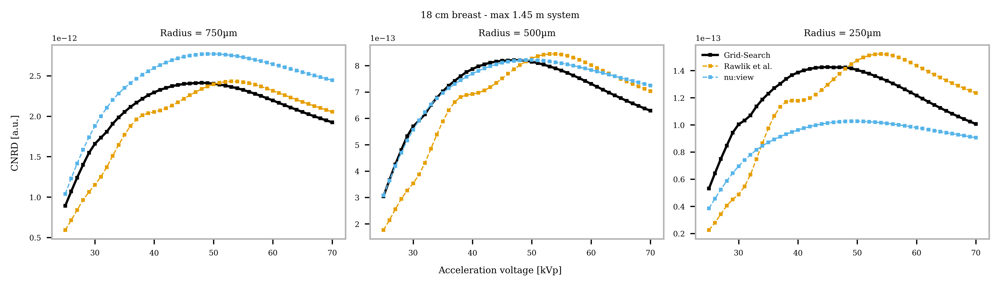

In [71]:
list_max_18 = [max_2mm, max_1mm, max_05mm]

corrected_rad = [750, 500, 250]

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

for i, rad in enumerate([2000, 1000, 500]):
    CNR_per_energy_static = [dict_sub[f'CNRD_{j}_{rad}um'][-1] for j in spectrum_kvp]
    axs[i].plot(spectrum_kvp, list_max_18[i], label = 'Grid-Search',)
    axs[i].plot(spectrum_kvp, CNR_per_energy_static, label = 'Rawlik et al.', linestyle = 'dashed', linewidth = 0.8)
    axs[i].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_{rad}um'] for j in spectrum_kvp], label = 'nu:view', linestyle = 'dashed', linewidth = 0.8)
    #axs[i].legend()
    axs[i].set_title('Radius = ' + str(corrected_rad[i]) + 'µm')
    #axs[i].axvline(50)

    #axs[i].axvline(46)
axs[i].legend()
fig.supxlabel('Acceleration voltage [kVp]')
fig.supylabel('CNRD [a.u.]')
fig.suptitle('18 cm breast - max 1.45 m system')
plt.show()

CNRD_static_2000_18 = [dict_sub[f'CNRD_{j}_2000um'][-1] for j in spectrum_kvp]
CNRD_static_1000_18 = [dict_sub[f'CNRD_{j}_1000um'][-1] for j in spectrum_kvp]
CNRD_static_500_18 = [dict_sub[f'CNRD_{j}_500um'][-1] for j in spectrum_kvp]

CNRD_static_18 = [CNRD_static_2000_18, CNRD_static_1000_18, CNRD_static_500_18]

CNRD_abct_2000_18 = [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp]
CNRD_abct_1000_18 = [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp]
CNRD_abct_500_18 = [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp]

CNRD_abct_18 = [CNRD_abct_2000_18, CNRD_abct_1000_18, CNRD_abct_500_18]

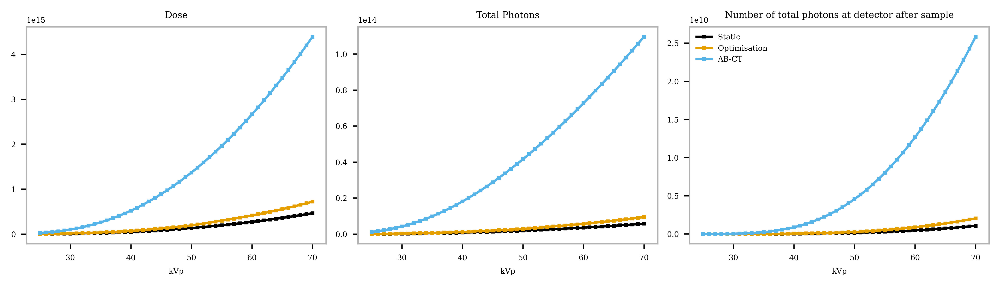

In [72]:

fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

total_photons_static = [dict_sub[f'Dose_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Dose_{j}'][0] for j in spectrum_kvp]
idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Dose_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]


axs[0].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[0].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[0].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[0].set_title('Dose')
axs[0].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Total_photons_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Total_photons_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Total_photons_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]
axs[1].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[1].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[1].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[1].set_title('Total Photons')
axs[1].set_xlabel('kVp')

total_photons_static = [dict_sub[f'Photons_detector_{j}'][-1] for j in spectrum_kvp]
total_photons_abct = [dict_sub[f'Photons_detector_{j}'][0] for j in spectrum_kvp]

idx_max = [np.argmax(dict_sub[f'CNRD_{j}_500um'][1:-1]) for j in spectrum_kvp ]
total_photons_max = [dict_sub[f'Photons_detector_{j}'][1:-1][idx_] for j, idx_ in zip(spectrum_kvp, idx_max)]

axs[2].plot(spectrum_kvp, np.asarray(total_photons_static), label = 'Static')
axs[2].plot(spectrum_kvp, np.asarray(total_photons_max), label = 'Optimisation')
axs[2].plot(spectrum_kvp, total_photons_abct, label = 'AB-CT')

axs[2].set_title('Number of total photons at detector after sample')
axs[2].set_xlabel('kVp')



axs[2].legend()

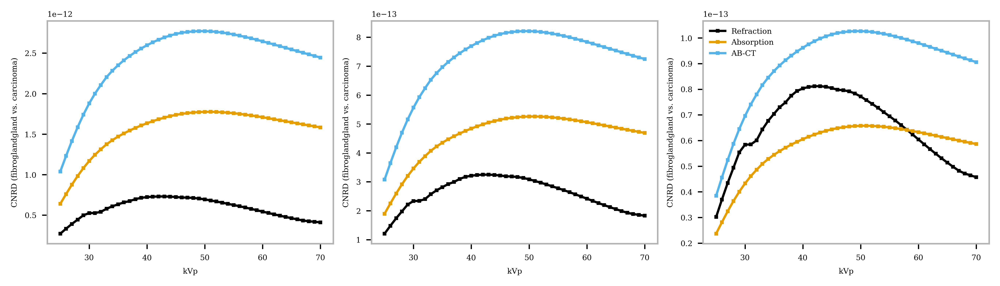

In [73]:
fig, axs = plt.subplots(figsize = (9,2.5), nrows = 1, ncols = 3)

axs[0].plot(spectrum_kvp, max_2mm_ref, label = 'Refraction')
axs[0].plot(spectrum_kvp, np.asarray(max_2mm_att), label = 'Absorption')
axs[0].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_2000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[0].set_xlabel('kVp')
axs[0].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[1].plot(spectrum_kvp, max_1mm_ref, label = 'Refraction')
axs[1].plot(spectrum_kvp, np.asarray(max_1mm_att), label = 'Absorption')
axs[1].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_1000um'] for j in spectrum_kvp], label = 'AB-CT')

axs[1].set_xlabel('kVp')
axs[1].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].plot(spectrum_kvp, max_05mm_ref, label = 'Refraction')
axs[2].plot(spectrum_kvp, np.asarray(max_05mm_att), label = 'Absorption')
axs[2].plot(spectrum_kvp, [dict_sub[f'CNRD_commercial_{j}_500um'] for j in spectrum_kvp], label = 'AB-CT')

axs[2].set_xlabel('kVp')
axs[2].set_ylabel('CNRD (fibroglandgland vs. carcinoma)')

axs[2].legend()

### Plots conclusion

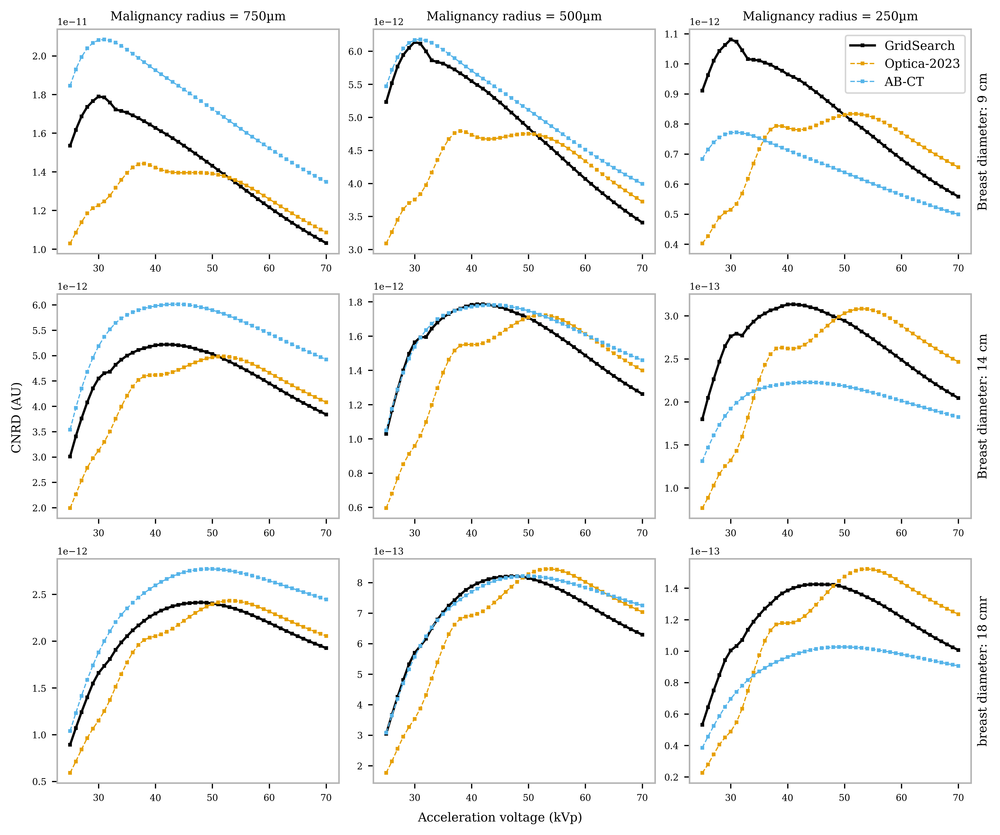

In [74]:
list_max_18 = [max_2mm, max_1mm, max_05mm]

fig, axs = plt.subplots(figsize = (9,7.5), nrows = 3, ncols = 3)
axs = axs.ravel()

corrected_rad = [750, 500, 250]

for i, rad in enumerate([1500, 750, 350]):
    axs[i].plot(spectrum_kvp, list_max_9[i], label = 'GridSearch',)
    axs[i].plot(spectrum_kvp, CNRD_static_9[i], label = 'Optica-2023', linestyle = 'dashed', linewidth = 0.8)
    axs[i].plot(spectrum_kvp, CNRD_abct_9[i], label = 'AB-CT', linestyle = 'dashed', linewidth = 0.8)
    #axs[i].legend()
    axs[i].set_title('Malignancy radius = ' + str(corrected_rad[i]) + 'µm', fontsize = 8)



    axs[i+3].plot(spectrum_kvp, list_max_14[i], label = 'GridSearch',)
    axs[i+3].plot(spectrum_kvp, CNRD_static_14[i], label = 'Optica-2023', linestyle = 'dashed', linewidth = 0.8)
    axs[i+3].plot(spectrum_kvp, CNRD_abct_14[i], label = 'AB-CT', linestyle = 'dashed', linewidth = 0.8)


    axs[i+6].plot(spectrum_kvp, list_max_18[i], label = 'GridSearch',)
    axs[i+6].plot(spectrum_kvp, CNRD_static_18[i], label = 'Optica-2023', linestyle = 'dashed', linewidth = 0.8)
    axs[i+6].plot(spectrum_kvp, CNRD_abct_18[i], label = 'AB-CT', linestyle = 'dashed', linewidth = 0.8)

axs[i].legend(fontsize=8, frameon=True)

axs[2].yaxis.set_label_position("right")  # Move label position to the right
axs[2].set_ylabel("Breast diameter: 9 cm", fontsize = 8)

axs[5].yaxis.set_label_position("right")  # Move label position to the right
axs[5].set_ylabel("Breast diameter: 14 cm", fontsize = 8)

axs[8].yaxis.set_label_position("right")  # Move label position to the right
axs[8].set_ylabel("breast diameter: 18 cmr", fontsize = 8)


fig.supylabel('CNRD (AU)', fontsize=8)

# # Add labels on the left side for each row
# fig.text(-0.01, 0.78, "9 cm breast", va='center', rotation='vertical', fontsize=8)
# fig.text(-0.01, 0.51, "14 cm breast", va='center', rotation='vertical', fontsize=8)
# fig.text(-0.01, 0.24, "18 cm breast", va='center', rotation='vertical', fontsize=8)
for ax in axs:
    ax.tick_params(axis='both', which='major', labelsize=6)  # Adjust tick label size
    ax.yaxis.get_offset_text().set_fontsize(6)  # Adjust offset text size

fig.supxlabel('Acceleration voltage (kVp)', fontsize = 8)
fig.supylabel('CNRD (AU)', fontsize = 8)
#fig.suptitle('2m system')
#plt.savefig('data/1_45m_CNRD_carcinoma_fibrogland_pxScaled.png', bbox_inches = 'tight')
plt.show()

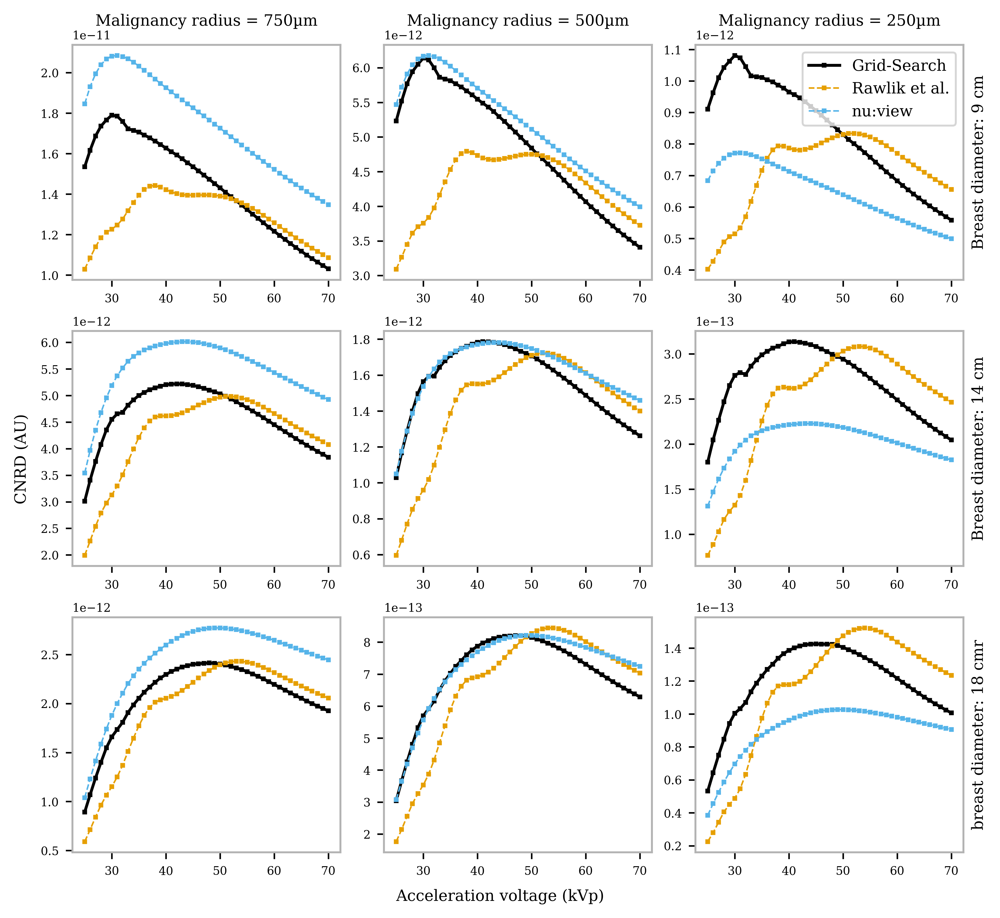

In [76]:
list_max_18 = [max_2mm, max_1mm, max_05mm]

fig, axs = plt.subplots(figsize = (7.08661,6.5), nrows = 3, ncols = 3)
axs = axs.ravel()

corrected_rad = [750, 500, 250]

for i, rad in enumerate([1500, 750, 350]):
    axs[i].plot(spectrum_kvp, list_max_9[i], label = 'Grid-Search',)
    axs[i].plot(spectrum_kvp, CNRD_static_9[i], label = 'Rawlik et al.', linestyle = 'dashed', linewidth = 0.8)
    axs[i].plot(spectrum_kvp, CNRD_abct_9[i], label = 'nu:view', linestyle = 'dashed', linewidth = 0.8)
    #axs[i].legend()
    axs[i].set_title('Malignancy radius = ' + str(corrected_rad[i]) + 'µm', fontsize = 8, pad = 10)



    axs[i+3].plot(spectrum_kvp, list_max_14[i], label = 'Grid-Search',)
    axs[i+3].plot(spectrum_kvp, CNRD_static_14[i], label = 'Rawlik et al.', linestyle = 'dashed', linewidth = 0.8)
    axs[i+3].plot(spectrum_kvp, CNRD_abct_14[i], label = 'nu:view', linestyle = 'dashed', linewidth = 0.8)


    axs[i+6].plot(spectrum_kvp, list_max_18[i], label = 'Grid-Search',)
    axs[i+6].plot(spectrum_kvp, CNRD_static_18[i], label = 'Rawlik et al.', linestyle = 'dashed', linewidth = 0.8)
    axs[i+6].plot(spectrum_kvp, CNRD_abct_18[i], label = 'nu:view', linestyle = 'dashed', linewidth = 0.8)

axs[i].legend(fontsize=8, frameon=True)

axs[2].yaxis.set_label_position("right")  # Move label position to the right
axs[2].set_ylabel("Breast diameter: 9 cm", fontsize = 8)

axs[5].yaxis.set_label_position("right")  # Move label position to the right
axs[5].set_ylabel("Breast diameter: 14 cm", fontsize = 8)

axs[8].yaxis.set_label_position("right")  # Move label position to the right
axs[8].set_ylabel("breast diameter: 18 cmr", fontsize = 8)


fig.supylabel('CNRD (AU)', fontsize=8)

# # Add labels on the left side for each row
# fig.text(-0.01, 0.78, "9 cm breast", va='center', rotation='vertical', fontsize=8)
# fig.text(-0.01, 0.51, "14 cm breast", va='center', rotation='vertical', fontsize=8)
# fig.text(-0.01, 0.24, "18 cm breast", va='center', rotation='vertical', fontsize=8)
for ax in axs:
    ax.tick_params(axis='both', which='major', labelsize=6)  # Adjust tick label size
    ax.yaxis.get_offset_text().set_fontsize(6)  # Adjust offset text size

fig.supxlabel('Acceleration voltage (kVp)', fontsize = 8)
fig.supylabel('CNRD (AU)', fontsize = 8)
#fig.suptitle('2m system')
#plt.savefig('data/1_45m_CNRD_carcinoma_fibrogland_pxScaled.eps', bbox_inches = 'tight', format = 'eps', dpi = 600)
plt.show()